___

<p style="text-align: center;"><img src="https://docs.google.com/uc?id=1lY0Uj5R04yMY3-ZppPWxqCr5pvBLYPnV" class="img-fluid" alt="CLRSWY"></p>

___

<h1 style="text-align: center;">Deep Learning<br><br>Session - 3<br><br>Regression with ANN<br><br>KC House Data<br><h1>

We will be using data from a Kaggle data set:

https://www.kaggle.com/harlfoxem/housesalesprediction

#### Feature Columns
    
* id - Unique ID for each home sold
* date - Date of the home sale
* price - Price of each home sold
* bedrooms - Number of bedrooms
* bathrooms - Number of bathrooms, where .5 accounts for a room with a toilet but no shower
* sqft_living - Square footage of the apartments interior living space
* sqft_lot - Square footage of the land space
* floors - Number of floors
* waterfront - A dummy variable for whether the apartment was overlooking the waterfront or not
* view - An index from 0 to 4 of how good the view of the property was
* condition - An index from 1 to 5 on the condition of the apartment,
* grade - An index from 1 to 13, where 1-3 falls short of building construction and design, 7 has an average level of construction and design, and 11-13 have a high quality level of construction and design.
* sqft_above - The square footage of the interior housing space that is above ground level
* sqft_basement - The square footage of the interior housing space that is below ground level
* yr_built - The year the house was initially built
* yr_renovated - The year of the house’s last renovation
* zipcode - What zipcode area the house is in
* lat - Lattitude
* long - Longitude
* sqft_living15 - The square footage of interior housing living space for the nearest 15 neighbors
* sqft_lot15 - The square footage of the land lots of the nearest 15 neighbors

# Keras Regression

In [192]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import warnings
warnings.filterwarnings("ignore")
warnings.warn("this will not show")

plt.rcParams["figure.figsize"] = (10, 6)

sns.set_style("whitegrid")
pd.set_option("display.float_format", lambda x: "%.3f" % x)
pd.set_option("display.max_columns", None)

In [193]:
df = pd.read_csv("kc_house_data.csv")

## Exploratory Data Analysis and Visualization

In [194]:
df.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,10/13/2014,221900.000,3,1.000,1180,5650,1.000,0,0,3,7,1180,0,1955,0,98178,47.511,-122.257,1340,5650
1,6414100192,12/9/2014,538000.000,3,2.250,2570,7242,2.000,0,0,3,7,2170,400,1951,1991,98125,47.721,-122.319,1690,7639
2,5631500400,2/25/2015,180000.000,2,1.000,770,10000,1.000,0,0,3,6,770,0,1933,0,98028,47.738,-122.233,2720,8062
3,2487200875,12/9/2014,604000.000,4,3.000,1960,5000,1.000,0,0,5,7,1050,910,1965,0,98136,47.521,-122.393,1360,5000
4,1954400510,2/18/2015,510000.000,3,2.000,1680,8080,1.000,0,0,3,8,1680,0,1987,0,98074,47.617,-122.045,1800,7503


In [195]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             21597 non-null  int64  
 1   date           21597 non-null  object 
 2   price          21597 non-null  float64
 3   bedrooms       21597 non-null  int64  
 4   bathrooms      21597 non-null  float64
 5   sqft_living    21597 non-null  int64  
 6   sqft_lot       21597 non-null  int64  
 7   floors         21597 non-null  float64
 8   waterfront     21597 non-null  int64  
 9   view           21597 non-null  int64  
 10  condition      21597 non-null  int64  
 11  grade          21597 non-null  int64  
 12  sqft_above     21597 non-null  int64  
 13  sqft_basement  21597 non-null  int64  
 14  yr_built       21597 non-null  int64  
 15  yr_renovated   21597 non-null  int64  
 16  zipcode        21597 non-null  int64  
 17  lat            21597 non-null  float64
 18  long  

In [196]:
df.isnull().sum().sum()

0

In [197]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
id,21597.000,4580474287.771,2876735715.748,1000102.000,2123049175.000,3904930410.000,7308900490.000,9900000190.000
price,21597.000,540296.574,367368.140,78000.000,322000.000,450000.000,645000.000,7700000.000
bedrooms,21597.000,3.373,0.926,1.000,3.000,3.000,4.000,33.000
bathrooms,21597.000,2.116,0.769,0.500,1.750,2.250,2.500,8.000
sqft_living,21597.000,2080.322,918.106,370.000,1430.000,1910.000,2550.000,13540.000
sqft_lot,21597.000,15099.409,41412.637,520.000,5040.000,7618.000,10685.000,1651359.000
floors,21597.000,1.494,0.540,1.000,1.000,1.500,2.000,3.500
waterfront,21597.000,0.008,0.087,0.000,0.000,0.000,0.000,1.000
view,21597.000,0.234,0.766,0.000,0.000,0.000,0.000,4.000
condition,21597.000,3.410,0.651,1.000,3.000,3.000,4.000,5.000


In [198]:
df.duplicated().sum()

0

### İd_number

In [199]:
df.drop(columns="id", inplace=True)

In [200]:
df.duplicated().sum()

0

In [201]:
df.shape

(21597, 20)

### price

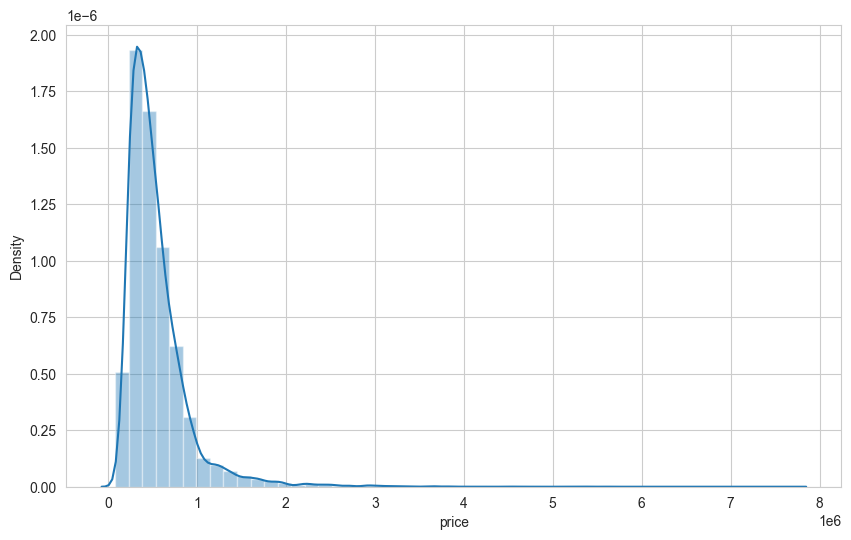

In [202]:
sns.distplot(df["price"]);
# Burada dağılıma baktığımızda çok uçuk ücretler görüyoruz.

In [203]:
df[df["price"] > 3000000].sort_values(by="price", ascending=False)

,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
7245,10/13/2014,7700000.000,6,8.000,12050,27600,2.500,0,3,4,13,8570,3480,1910,1987,98102,47.630,-122.323,3940,8800
3910,6/11/2014,7060000.000,5,4.500,10040,37325,2.000,1,2,3,11,7680,2360,1940,2001,98004,47.650,-122.214,3930,25449
9245,9/19/2014,6890000.000,6,7.750,9890,31374,2.000,0,4,3,13,8860,1030,2001,0,98039,47.630,-122.240,4540,42730
4407,8/4/2014,5570000.000,5,5.750,9200,35069,2.000,0,0,3,13,6200,3000,2001,0,98039,47.629,-122.233,3560,24345
1446,4/13/2015,5350000.000,5,5.000,8000,23985,2.000,0,4,3,12,6720,1280,2009,0,98004,47.623,-122.220,4600,21750
1313,4/13/2015,5300000.000,6,6.000,7390,24829,2.000,1,4,4,12,5000,2390,1991,0,98040,47.563,-122.210,4320,24619
1162,10/20/2014,5110000.000,5,5.250,8010,45517,2.000,1,4,3,12,5990,2020,1999,0,98033,47.677,-122.211,3430,26788
8085,6/17/2014,4670000.000,5,6.750,9640,13068,1.000,1,4,3,12,4820,4820,1983,2009,98040,47.557,-122.210,3270,10454
2624,8/15/2014,4500000.000,5,5.500,6640,40014,2.000,1,4,3,12,6350,290,2004,0,98155,47.749,-122.280,3030,23408
8629,6/18/2014,4490000.000,4,3.000,6430,27517,2.000,0,0,3,12,6430,0,2001,0,98004,47.621,-122.219,3720,14592


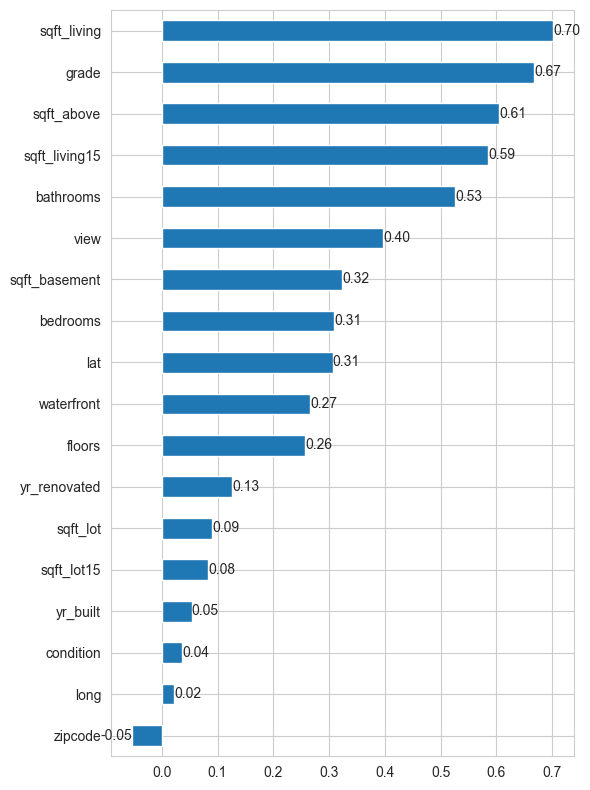

In [204]:
plt.figure(figsize = (6, 8))
ax = df.corr()["price"].sort_values().drop("price").plot(kind="barh")
for i in ax.containers:
    ax.bar_label(i, fmt="%.2f")
plt.tight_layout()

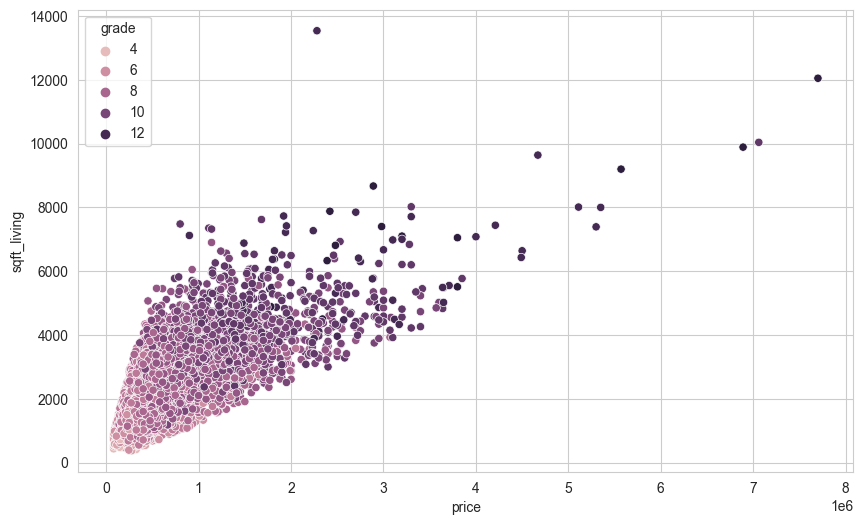

In [205]:
sns.scatterplot(data=df, x = "price", y = "sqft_living", hue = "grade");

### bedrooms

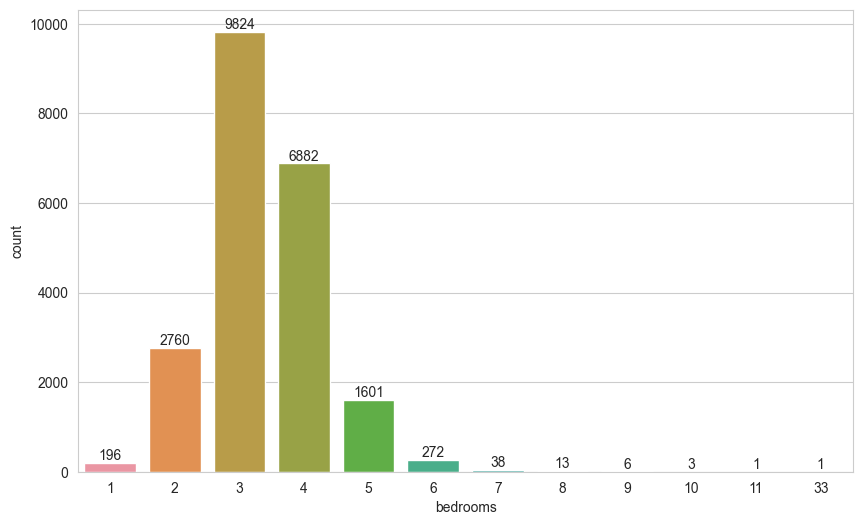

In [206]:
ax = sns.countplot(df["bedrooms"])
for i in ax.containers:
    ax.bar_label(i)

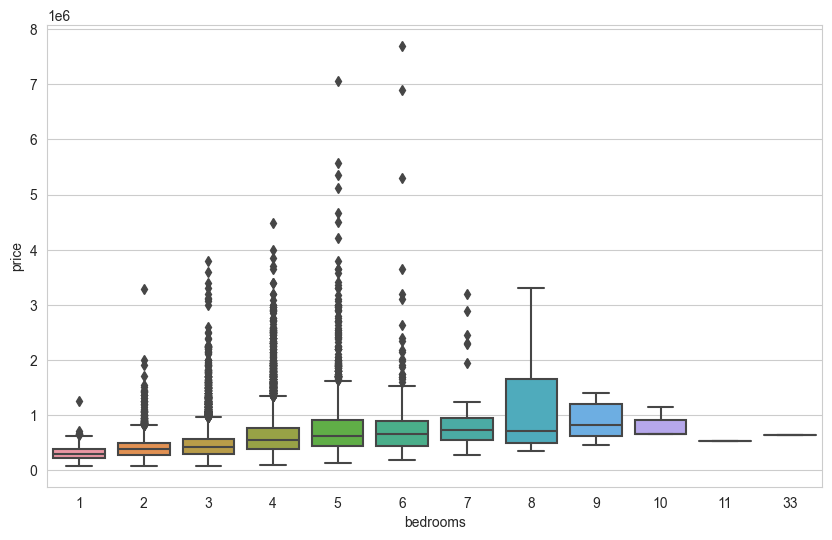

In [207]:
sns.boxplot(data=df, x = "bedrooms", y = "price");
# Burada bedroom sayısı 11, 33 olanların ücretleri a gözüküyor.şüpheli bir durum.

In [208]:
df[df["bedrooms"] > 10]

,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
8748,8/21/2014,520000.000,11,3.000,3000,4960,2.000,0,0,3,7,2400,600,1918,1999,98106,47.556,-122.363,1420,4960
15856,6/25/2014,640000.000,33,1.750,1620,6000,1.000,0,0,5,7,1040,580,1947,0,98103,47.688,-122.331,1330,4700


Most likely the data was entered incorrectly.

In [209]:
df = df[df["bedrooms"] < 11]

In [210]:
df.shape

(21595, 20)

### date

In [211]:
df["date"].dtypes

dtype('O')

In [212]:
df["date"] = pd.to_datetime(df["date"])

In [213]:
df["date"]

0       2014-10-13
1       2014-12-09
2       2015-02-25
3       2014-12-09
4       2015-02-18
           ...    
21592   2014-05-21
21593   2015-02-23
21594   2014-06-23
21595   2015-01-16
21596   2014-10-15
Name: date, Length: 21595, dtype: datetime64[ns]

In [214]:
df["year"] =  df["date"].dt.year

In [215]:
df["month"] = df["date"].dt.month

In [216]:
df.head()

,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,year,month
0,2014-10-13,221900.000,3,1.000,1180,5650,1.000,0,0,3,7,1180,0,1955,0,98178,47.511,-122.257,1340,5650,2014,10
1,2014-12-09,538000.000,3,2.250,2570,7242,2.000,0,0,3,7,2170,400,1951,1991,98125,47.721,-122.319,1690,7639,2014,12
2,2015-02-25,180000.000,2,1.000,770,10000,1.000,0,0,3,6,770,0,1933,0,98028,47.738,-122.233,2720,8062,2015,2
3,2014-12-09,604000.000,4,3.000,1960,5000,1.000,0,0,5,7,1050,910,1965,0,98136,47.521,-122.393,1360,5000,2014,12
4,2015-02-18,510000.000,3,2.000,1680,8080,1.000,0,0,3,8,1680,0,1987,0,98074,47.617,-122.045,1800,7503,2015,2


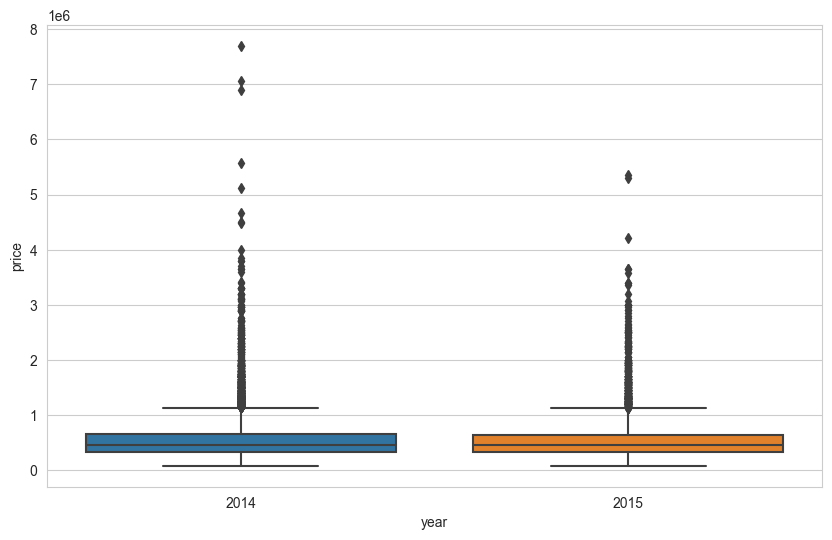

In [217]:
sns.boxplot(data=df, x = "year", y = "price");
# Yıllara göre çok belirgin bir fiyat değişimi yok gibi gözüküyor.

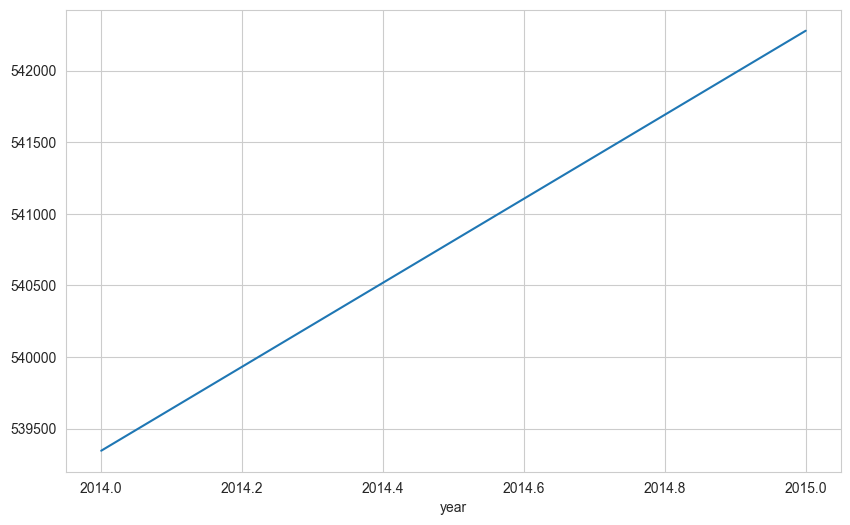

In [218]:
df.groupby("year")["price"].mean().plot();
# Burada da 1 yılda ortalama price'ın 2000 dolar arttığını görüyoruz. 
# Bu miktar çok az, belki enflasyon oranında bir artıştır çünkü doğrusal bir seyir izliyor.

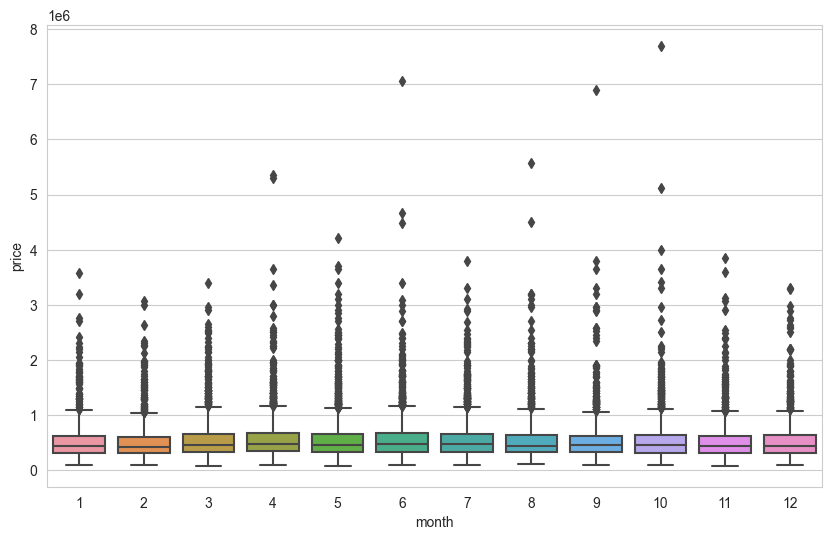

In [219]:
sns.boxplot(data = df, x = "month", y = "price");
# Aylara göre belitrgin bir fiyat değişimi yok gibi gözüküyor.

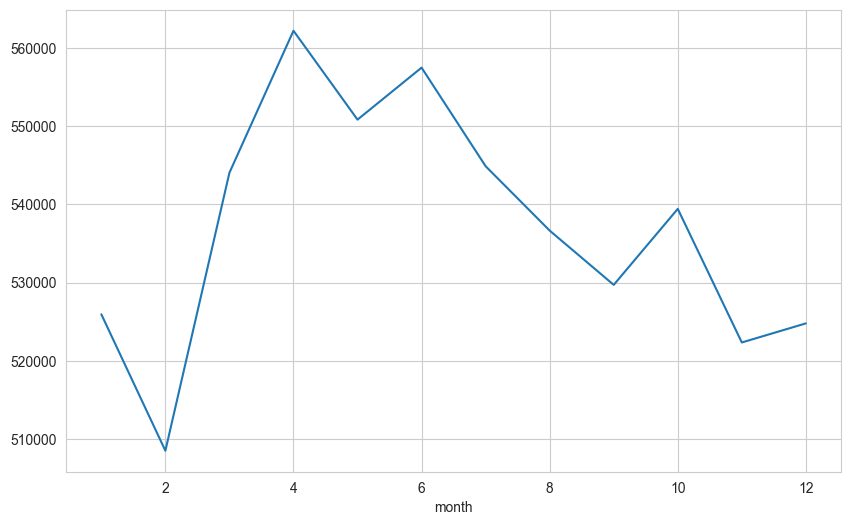

In [220]:
df.groupby("month")["price"].mean().plot();
# Buradaki değişimlere bakarak bir pattern çıkarmak mümkün gözükmüyor.
# Belki ilkbahar ve yaz aylarında bir artış var diyebiliriz.

In [221]:
# date, month ve year fiyatlardaki değişimi çok etkilemiyor gibi gözüküyor. Bu yüzden bunları düşüyoruz.
df.drop(columns=["date", "year", "month"], inplace=True)

### zipcode

In [222]:
df["zipcode"].value_counts()

98103    601
98038    589
98115    583
98052    574
98117    553
        ... 
98102    104
98010    100
98024     80
98148     57
98039     50
Name: zipcode, Length: 70, dtype: int64

we can categorize the zipcodes as north, south, west, east, middle by regions. But it can be made manually and taken many time and we need domain knowledge to do that. So we will drop this column.

In [223]:
df.drop(columns="zipcode", inplace=True)

### yr_renovated & yr_built

In [224]:
df["yr_renovated"].value_counts()

0       20682
2014       91
2013       37
2003       36
2005       35
        ...  
1951        1
1959        1
1948        1
1954        1
1944        1
Name: yr_renovated, Length: 70, dtype: int64

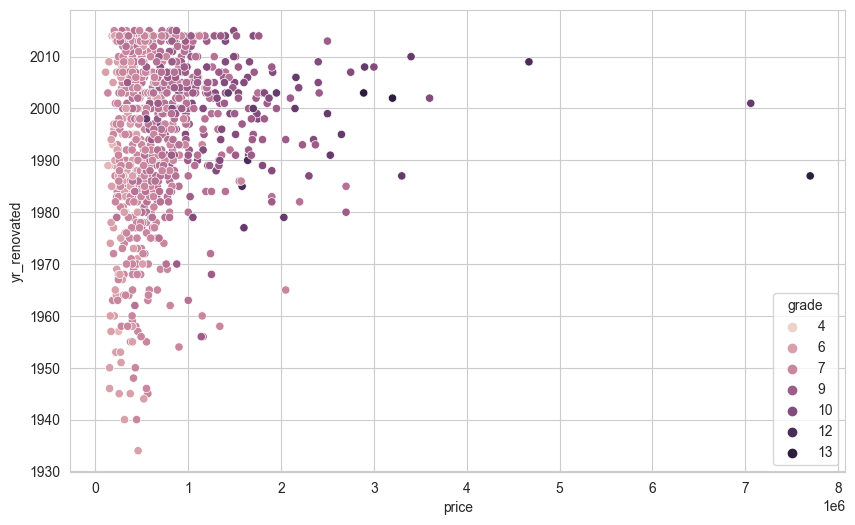

In [225]:
sns.scatterplot(data=df[df["yr_renovated"] != 0], x = "price", y = "yr_renovated", hue ="grade");
# Burada hiç yenilenmeyen evleri datadan düştük.
# Yenilenen evler arasında grade arttıkça fiyat artışı ve yenilenme yılı yaklaştıkça fiyat artışı var denebilir.

In [226]:
df["yr_built"].value_counts()

2014    559
2006    453
2005    450
2004    433
2003    420
       ... 
1933     30
1901     29
1902     27
1935     24
1934     21
Name: yr_built, Length: 116, dtype: int64

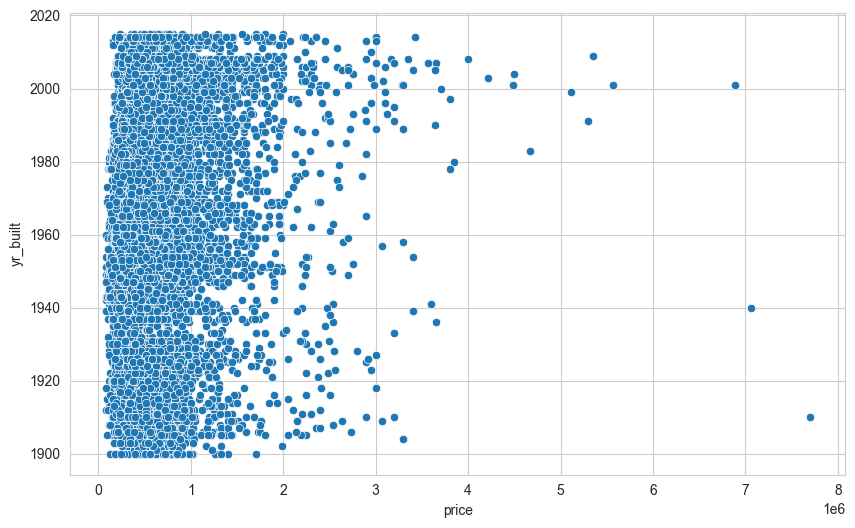

In [227]:
sns.scatterplot(data=df, x = "price", y = "yr_built");
# Burada çok bir insight alamadım.
# İki feature'u aynı grafikte görmek istiyorum.Bunun için düzenlemeler yapacağım.

In [228]:
df["renovated"] = df["yr_renovated"].apply(lambda x : x if x == 0 else 1)
# Burada evin yenileme işleminden geçip geçmediğini gösteren  yeni bir feature oluşturdum.

In [229]:
df["renovated"].value_counts()

0    20682
1      913
Name: renovated, dtype: int64

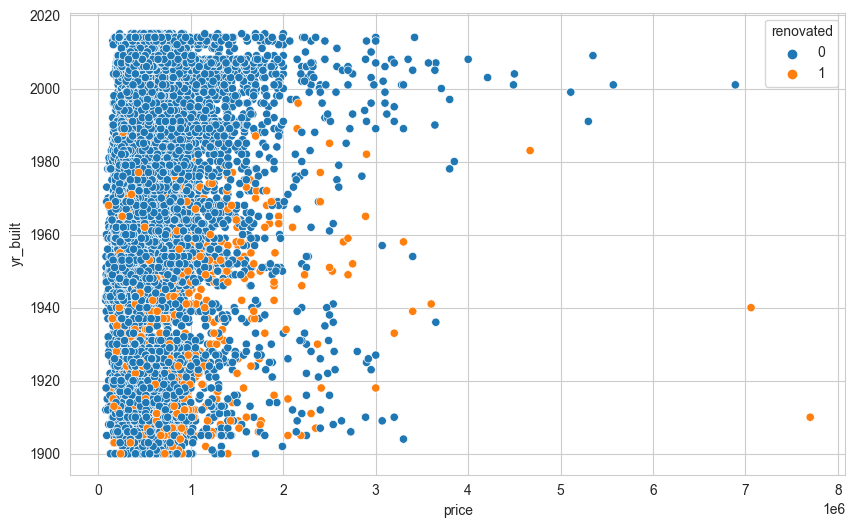

In [230]:
sns.scatterplot(data=df, x = "price", y = "yr_built", hue="renovated");
#Burada eski tarihte yapılan bazı evlerin renovation geçirdikten sonraki fiyatları yüksek gözüküyor.
# Burada yıl değeri olarak eğer renovation geçirmediyse yapıldığı yılı , renovation geçirdiyse renovation geçirdiği yılı
    # almak istiyorum.

In [231]:
df["built|renovated"] = df["yr_renovated"].replace(0, np.nan).fillna(df["yr_built"])
# Burada hiç yenileme geçirmeyenlerin tarihini yapım tarihi olarak aldık ve 2 feature'dan yeni bir feature ürettik.

In [232]:
df["built|renovated"].value_counts()

2014.000    650
2005.000    485
2006.000    477
2004.000    459
2003.000    455
           ... 
1901.000     28
1902.000     25
1933.000     23
1935.000     19
1934.000     14
Name: built|renovated, Length: 116, dtype: int64

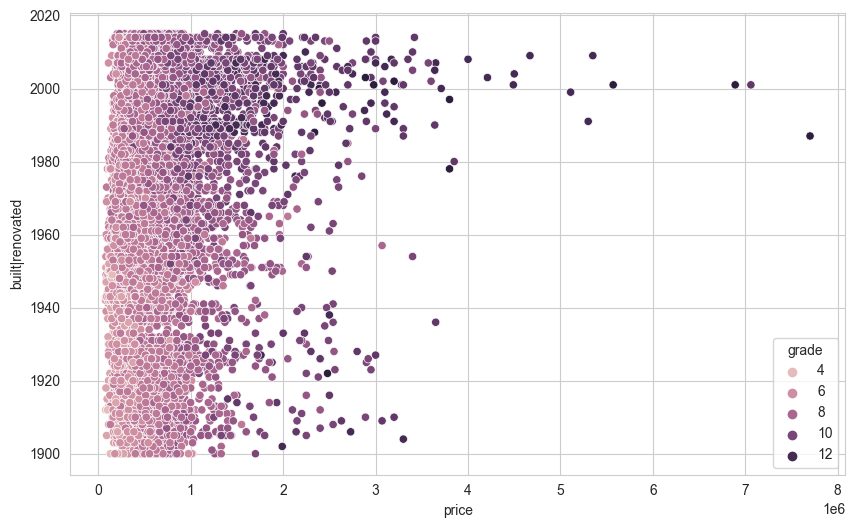

In [233]:
sns.scatterplot(data=df, x = "price", y = "built|renovated", hue = "grade");
# Burada yapım veya yenileme yıllarından oluşan feature'un bile fiyat hakkında güçlü bir insight vermediğinig düşünüyorum.
# Bu feature'ları düşeceğim.

In [234]:
df.drop(columns=["yr_renovated", "yr_built", "renovated"], inplace=True)

could make sense due to scaling, higher should correlate to more value

### sqft_basement

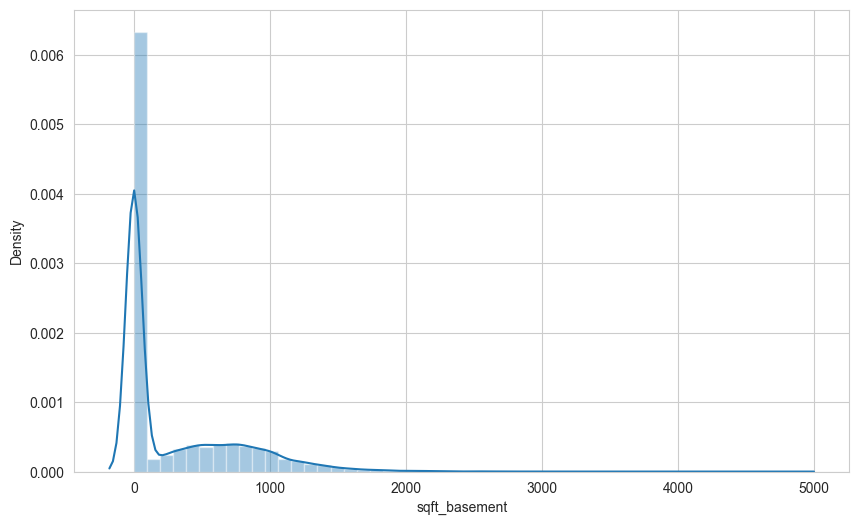

In [235]:
sns.distplot(df["sqft_basement"]);
# Burada dağılıma bakınca 2000 sq/feet' den fazla alana sahip evler var bunlara bir bakacağız.

In [236]:
df[df["sqft_basement"] > 2000].sort_values(by = "sqft_basement",ascending=False)
# Burada sqft_above ile sqft_basement toplamını sqft_living ile kontrol ettiğimde sıkıntı yok gözüküyor.
# Değerler birbirini sağlıyor.

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,lat,long,sqft_living15,sqft_lot15,built|renovated
8085,4670000.000,5,6.750,9640,13068,1.000,1,4,3,12,4820,4820,47.557,-122.210,3270,10454,2009.000
12764,2280000.000,7,8.000,13540,307752,3.000,0,4,3,12,9410,4130,47.667,-121.986,4850,217800,1999.000
15468,3200000.000,4,3.250,7000,28206,1.000,1,4,4,12,3500,3500,47.593,-122.086,4913,14663,1991.000
7245,7700000.000,6,8.000,12050,27600,2.500,0,3,4,13,8570,3480,47.630,-122.323,3940,8800,1987.000
10074,1900000.000,5,4.250,6510,16471,2.000,0,3,4,11,3250,3260,47.576,-122.242,4480,16471,1980.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16434,1880000.000,4,5.000,5810,7440,2.000,0,0,3,10,3790,2020,47.688,-122.212,3010,7200,2004.000
17398,1390000.000,4,3.000,4040,20001,1.000,0,0,3,9,2020,2020,47.641,-122.212,2990,20098,2001.000
1421,1400000.000,4,2.500,4040,9630,1.000,0,3,4,9,2020,2020,47.641,-122.410,3160,8025,1951.000
15834,1520000.000,5,3.500,5930,13288,2.000,0,2,3,11,3920,2010,47.554,-122.097,3860,12062,1996.000


could make sense due to scaling, higher should correlate to more value

### sqft_above

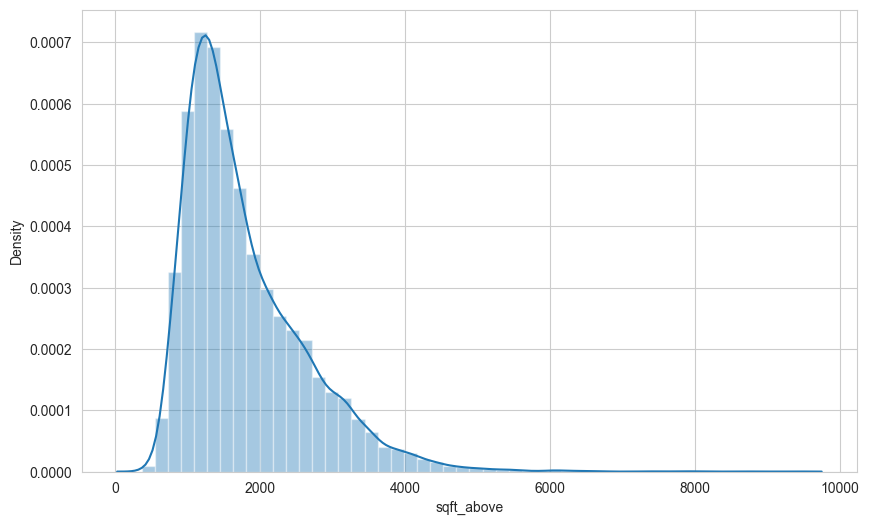

In [237]:
sns.distplot(df["sqft_above"]);
# Burada da 6000'den fazla alana sahip olana evleri kontrol etmek istiyorum.

In [238]:
df[df["sqft_above"] > 6000].sort_values(by= "sqft_above", ascending=False)
# Sayıların yukarıdaki gibi sağlamasını yapınca bir sorun yok gözüküyor.

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,lat,long,sqft_living15,sqft_lot15,built|renovated
12764,2280000.000,7,8.000,13540,307752,3.000,0,4,3,12,9410,4130,47.667,-121.986,4850,217800,1999.000
9245,6890000.000,6,7.750,9890,31374,2.000,0,4,3,13,8860,1030,47.630,-122.240,4540,42730,2001.000
7245,7700000.000,6,8.000,12050,27600,2.500,0,3,4,13,8570,3480,47.630,-122.323,3940,8800,1987.000
18288,3300000.000,5,6.250,8020,21738,2.000,0,0,3,11,8020,0,47.568,-122.189,4160,18969,2001.000
13398,2420000.000,5,4.750,7880,24250,2.000,0,2,3,13,7880,0,47.733,-122.362,2740,10761,1996.000
19842,2700000.000,4,4.000,7850,89651,2.000,0,0,3,12,7850,0,47.541,-121.982,6210,95832,2006.000
3910,7060000.000,5,4.500,10040,37325,2.000,1,2,3,11,7680,2360,47.650,-122.214,3930,25449,2001.000
11859,1950000.000,4,3.250,7420,167869,2.000,0,3,3,12,7420,0,47.455,-121.764,5610,169549,2002.000
18579,1140000.000,5,4.000,7320,217800,2.000,0,0,3,11,7320,0,47.447,-122.086,3270,34500,1992.000
1446,5350000.000,5,5.000,8000,23985,2.000,0,4,3,12,6720,1280,47.623,-122.220,4600,21750,2009.000


### Geographical Properties

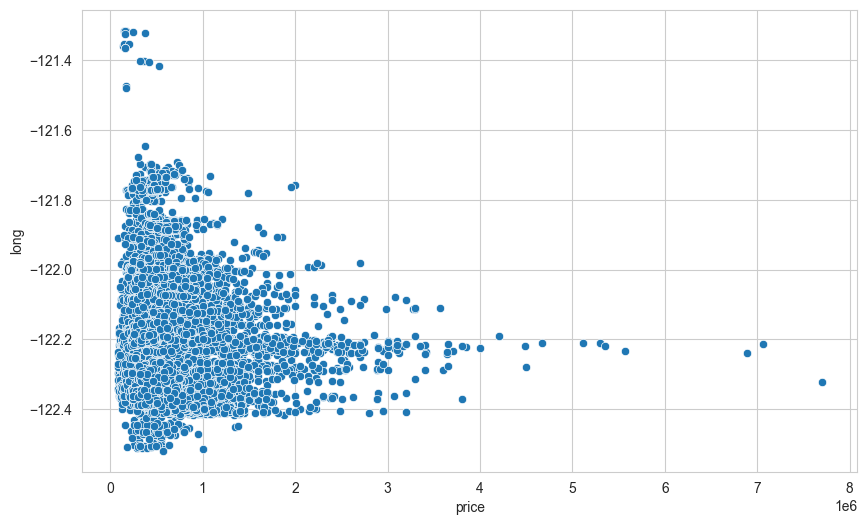

In [239]:
sns.scatterplot(data=df, x = "price", y = "long");
# özellikle 122.2 boylamı üzerinde ev ücretlerinin geniş bir aralıkta olduğunu görüyorum.
# 121.4 boylamı üzerindeki evler çok ucuz gözüküyor.
# konumun fiyatlara etkisi olmasını bekliyorduk zaten. Bir de enlem'e bakalım.

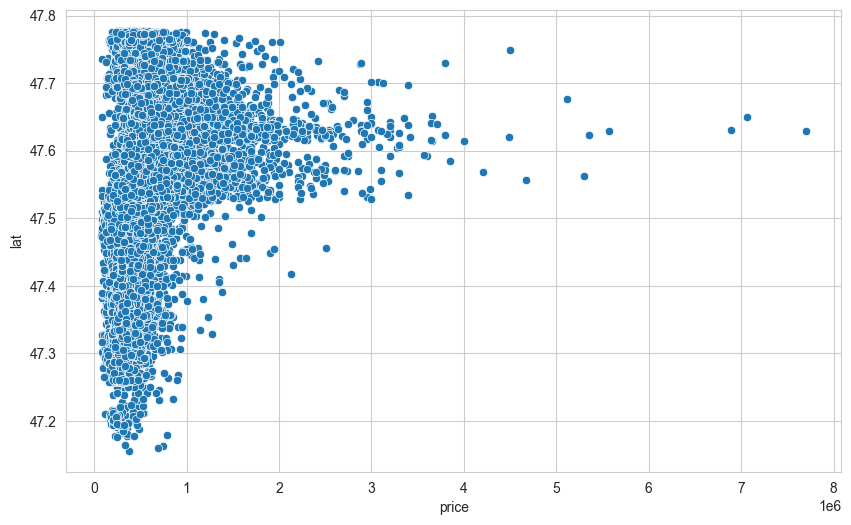

In [240]:
sns.scatterplot(data=df, x = "price", y = "lat");
# Aynı şekilde enlem de etkili gözüküyor.
# Enlem ve boylamı bir grafik üzerinde kullanıp fiyata olan etkisini görmek istiyorum.

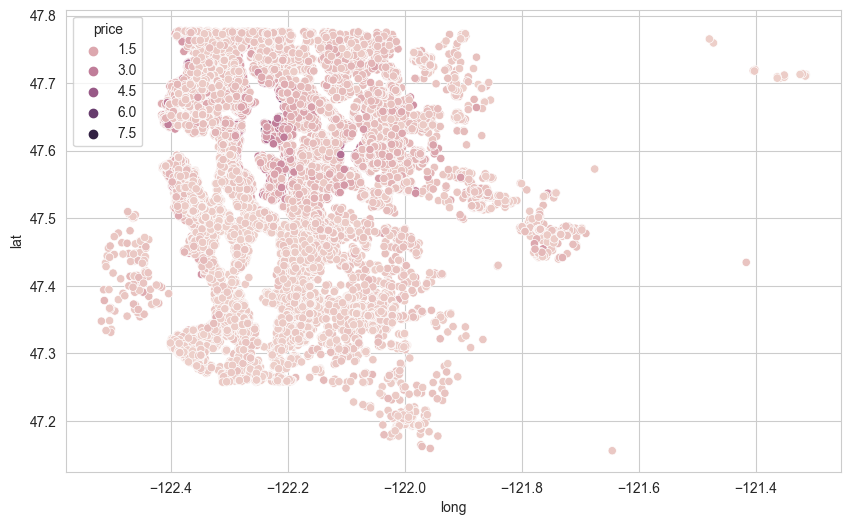

In [241]:
sns.scatterplot(data=df, x= "long", y = "lat", hue = "price");
# Burada özellikle lat=47.6 ve long=-122.2 üzerinde merkezde yüksek fiyatlı evler görüyorum.
# Ancak burada 21000'den fazla evi plot'ladığımız için noktalar üst üste gelmiş olabilir.
# Datanın daha küçük bir kısmını sample olarak alıp bakarsam daha iyi insight edinirim.

In [242]:
int(df.shape[0] * 0.01)

215

In [243]:
df.sort_values(by="price", ascending=False).head(215)

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,lat,long,sqft_living15,sqft_lot15,built|renovated
7245,7700000.000,6,8.000,12050,27600,2.500,0,3,4,13,8570,3480,47.630,-122.323,3940,8800,1987.000
3910,7060000.000,5,4.500,10040,37325,2.000,1,2,3,11,7680,2360,47.650,-122.214,3930,25449,2001.000
9245,6890000.000,6,7.750,9890,31374,2.000,0,4,3,13,8860,1030,47.630,-122.240,4540,42730,2001.000
4407,5570000.000,5,5.750,9200,35069,2.000,0,0,3,13,6200,3000,47.629,-122.233,3560,24345,2001.000
1446,5350000.000,5,5.000,8000,23985,2.000,0,4,3,12,6720,1280,47.623,-122.220,4600,21750,2009.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14536,1990000.000,3,2.500,2880,13500,1.000,0,4,5,8,1520,1360,47.628,-122.216,3710,20486,1950.000
19513,1980000.000,4,4.000,4360,12081,2.000,0,0,3,10,4360,0,47.638,-122.219,2180,10800,2007.000
7408,1980000.000,6,4.500,4800,9097,2.000,0,0,3,10,3580,1220,47.626,-122.291,2180,6037,2007.000
16511,1980000.000,4,3.500,4500,44384,1.000,0,0,3,12,3340,1160,47.632,-122.192,2540,26287,1990.000


In [244]:
non_top_1_perc = df.sort_values(by="price", ascending=False).iloc[216:]
# Burada en pahalı evlerden %1 lik dilime giren datayı düşerek bir daha görselleştireceğim.

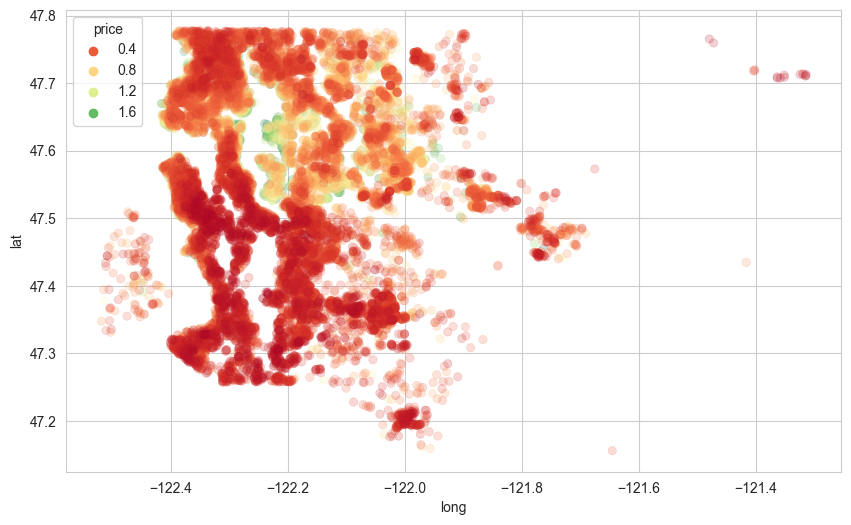

In [245]:
sns.scatterplot(data = non_top_1_perc, x = "long", y = "lat", hue = "price", palette = "RdYlGn", edgecolor=None, alpha=0.2);
# Bu grafikte de yukarıdakiyle aynı bölgede yüksek fiyatlı evler görüyorum.
# Ancak bunu bir harita üzerinde görüp konumları hakkında daha detaylı bilgi sahibi olabilirim.

### latest data

In [246]:
import folium
import branca.colormap as cm

In [247]:
folium.Map(location = [df["lat"].mean(), df["long"].mean()], zoom_start = 10)
# Burada location'a enlem ve boylamın ortalama değerini girerek haritanın merkezini belirledim.

In [248]:
# Bu haritada fiyat aralıklarını göre renklendirme yaparak nerelerde fiyatlar hangi aralıkta görmek istiyorum.
# Bunun için price'ı 5' e bölmeye karar verdim.

price_1 = df["price"].min()
price_2 = df["price"].quantile(0.25)
price_3 = df["price"].quantile(0.50)
price_4 = df["price"].quantile(0.75)
price_5 = df["price"].max()

In [249]:
m = folium.Map(location = [df["lat"].mean(), df["long"].mean()], zoom_start = 10)
colormap = cm.StepColormap(colors = ["red", "orange", "yellow", "green"],
                           index = [price_1, price_2, price_3, price_4, price_5],
                           vmin = price_1,
                           vmax = price_2)

for location, price in zip(zip(df["lat"], df["long"]), df["price"]):
    folium.Circle(location = location, radius = 1, fill = True, color = colormap(price)).add_to(m)
    
m

# Bu haritaya baktığımızda şehrin kuzeyindeki evlerin güneyindeki evlere göre daha pahalı olduğunu görebiliyoruz.
# Ayrıca deniz kıyısı yerlerde de ev fiyatları yüksek.

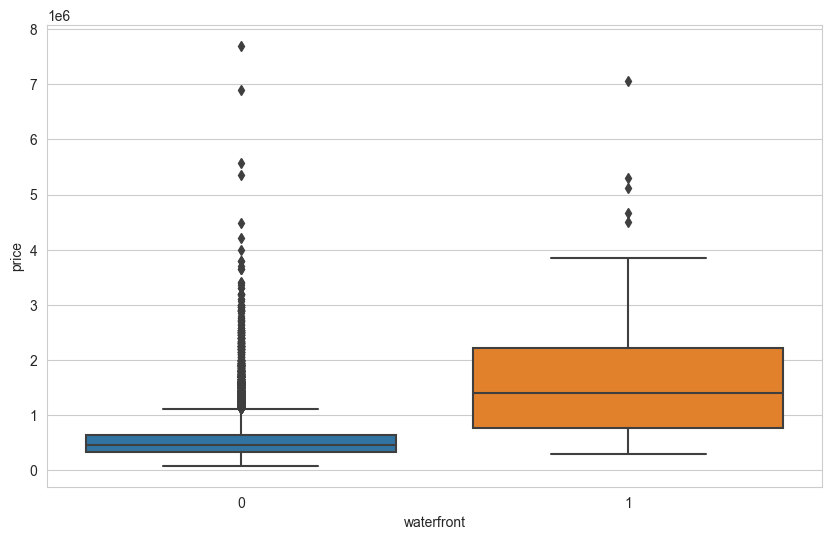

In [250]:
sns.boxplot(data = df, x = "waterfront", y = "price");
# Deniz manzarası olan evlerin fiytatlarında bir artış olduğunun sağlamasını yapmış olduk.

In [251]:
df.groupby("waterfront")["price"].mean()

waterfront
0    531757.823
1   1662524.184
Name: price, dtype: float64

### latest data

In [252]:
# Modelleme'ye geçmeden önce datamızın bir son haline bakalım.
df.head()

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,lat,long,sqft_living15,sqft_lot15,built|renovated
0,221900.000,3,1.000,1180,5650,1.000,0,0,3,7,1180,0,47.511,-122.257,1340,5650,1955.000
1,538000.000,3,2.250,2570,7242,2.000,0,0,3,7,2170,400,47.721,-122.319,1690,7639,1991.000
2,180000.000,2,1.000,770,10000,1.000,0,0,3,6,770,0,47.738,-122.233,2720,8062,1933.000
3,604000.000,4,3.000,1960,5000,1.000,0,0,5,7,1050,910,47.521,-122.393,1360,5000,1965.000
4,510000.000,3,2.000,1680,8080,1.000,0,0,3,8,1680,0,47.617,-122.045,1800,7503,1987.000


In [253]:
df.shape

(21595, 17)

## Preprocessing of Data
- Train | Test Split, Scalling

In [254]:
from sklearn.model_selection import train_test_split

In [255]:
X = df.drop(columns = "price")
y = df["price"]

In [256]:
seed = 101

In [257]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.1, random_state = seed)

In [258]:
from sklearn.preprocessing import MinMaxScaler
# Eğer datamızda çok fazla outlier olsaydı RoboustScaler() kullanacaktık ancak onun dışında MinMaxScaler() kullanıyoruz.

In [259]:
scaler = MinMaxScaler()

In [260]:
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

## Modelling & Model Performance

In [261]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense

In [262]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

In [263]:
def eval_metric(actual, pred):
    mae = mean_absolute_error(actual, pred)
    mse = mean_squared_error(actual, pred)
    rmse = np.sqrt(mse)
    score = r2_score(actual, pred)
    return print("r2_score:", score, "\nmae:", mae, "\nmse", mse, "\nrmse:", rmse)

In [264]:
X_train.shape

(19435, 16)

In [267]:
tf.random.set_seed(seed)
# Random değerlerin atanmasındaki randomlığı minimize eder.

tf.keras.backend.clear_session()
# Layer sayılarının tekrar 1'den başlamasını sağlar.

model = Sequential()  # burada Sequential() modelin tipini belirtmek için kullanılır.

model.add(Dense(units = 24, activation = "relu", input_dim = X_train.shape[1])) # Dense olarak belirttiklerimiz layerlardır.
model.add(Dense(units = 16, activation = "relu"))
model.add(Dense(units = 8, activation = "relu"))
model.add(Dense(units = 4, activation = "relu"))
model.add(Dense(1))

model.compile(optimizer = "adam", loss = "mse")

# Genelde Dense içinde units(nöron) sayısı belirtirken çoktan aza doğru gidilir.
# Ayrıca nöron sayısı belirtirken feature sayısının % 50 fazlası kadar sayıda nöronla başlanması önerilir. Bağlayıcı değil.
# Burada layer sayısını belirlerken keskin kurallar yoktur. Kendimiz belirliyoruz ancak çok sayıda veya çok az sayıda
    # nöron belirtmek overfitting-underfitting durumlarına sebep olabilir.

In [269]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 24)                408       
                                                                 
 dense_1 (Dense)             (None, 16)                400       
                                                                 
 dense_2 (Dense)             (None, 8)                 136       
                                                                 
 dense_3 (Dense)             (None, 4)                 36        
                                                                 
 dense_4 (Dense)             (None, 1)                 5         
                                                                 
Total params: 985
Trainable params: 985
Non-trainable params: 0
_________________________________________________________________


In [270]:
model.weights

[<tf.Variable 'dense/kernel:0' shape=(16, 24) dtype=float32, numpy=
 array([[-0.02361324,  0.28002524, -0.04764625, -0.26058763, -0.2935503 ,
         -0.08598879,  0.22074914, -0.33200678, -0.1192641 ,  0.38404268,
         -0.23445605,  0.20811176, -0.02440515,  0.36594462,  0.2335192 ,
         -0.28351212, -0.01308602, -0.00212425, -0.00520968,  0.24308485,
          0.01973203,  0.24018401,  0.14239883,  0.03406769],
        [-0.34055784,  0.03937274,  0.11537808, -0.1865265 , -0.20852058,
         -0.12055287,  0.21249884,  0.19415891, -0.10924917,  0.03429383,
          0.3307324 , -0.1681899 , -0.21664503,  0.31441158,  0.19536352,
         -0.21030097,  0.36913478,  0.04838228,  0.34717023, -0.35925993,
          0.0223771 ,  0.30879366, -0.30386016, -0.0685716 ],
        [-0.37039474, -0.10758615, -0.31030738, -0.23331104,  0.0338589 ,
          0.26225513, -0.29990852,  0.23547041, -0.14759798, -0.3593667 ,
         -0.2187223 , -0.32824212,  0.23949862,  0.14210027, -0.3089

In [272]:
model.fit(x = X_train, y = y_train, validation_split = 0.15, batch_size = 128, epochs = 1000)

# Burada validation_split = 0.15 aldık. Eğer çok sayıda datanız varsa validation_split kullanmanız önerilir.
# Train =0.90, test = 0.10 olarak bölmüştük daha önce. şimdi bu %90' ın %15' ini validation olarak ayırdık.
# Her epoch sonrası bu validation datası ile test yapacak ve sonucu validation_loss olarak gösterecek.
# Burada batch size'ı 2'nin katı belirtmekte fayda var. Yine datanın büyüklüğüne göre batch_size artırılabilir.

Epoch 1/1000
130/130 [==============================] - 1s 2ms/step - loss: 433273339904.0000 - val_loss: 403792658432.0000
Epoch 2/1000
130/130 [==============================] - 0s 1ms/step - loss: 433182343168.0000 - val_loss: 403531759616.0000
Epoch 3/1000
130/130 [==============================] - 0s 1ms/step - loss: 432281092096.0000 - val_loss: 401646682112.0000
Epoch 4/1000
130/130 [==============================] - 0s 1ms/step - loss: 428039110656.0000 - val_loss: 394403807232.0000
Epoch 5/1000
130/130 [==============================] - 0s 1ms/step - loss: 415046860800.0000 - val_loss: 375240327168.0000
Epoch 6/1000
130/130 [==============================] - 0s 1ms/step - loss: 385539309568.0000 - val_loss: 336532996096.0000
Epoch 7/1000
130/130 [==============================] - 0s 1ms/step - loss: 333153632256.0000 - val_loss: 275090079744.0000
Epoch 8/1000
130/130 [==============================] - 0s 1ms/step - loss: 260139794432.0000 - val_loss: 200109654016.0000
Epoch 9/

130/130 [==============================] - 0s 1ms/step - loss: 49806401536.0000 - val_loss: 50195288064.0000
Epoch 68/1000
130/130 [==============================] - 0s 1ms/step - loss: 49551466496.0000 - val_loss: 49925337088.0000
Epoch 69/1000
130/130 [==============================] - 0s 1ms/step - loss: 49315758080.0000 - val_loss: 49729957888.0000
Epoch 70/1000
130/130 [==============================] - 0s 1ms/step - loss: 49066975232.0000 - val_loss: 49490296832.0000
Epoch 71/1000
130/130 [==============================] - 0s 1ms/step - loss: 48842665984.0000 - val_loss: 49294303232.0000
Epoch 72/1000
130/130 [==============================] - 0s 1ms/step - loss: 48602476544.0000 - val_loss: 49096916992.0000
Epoch 73/1000
130/130 [==============================] - 0s 1ms/step - loss: 48394715136.0000 - val_loss: 48902103040.0000
Epoch 74/1000
130/130 [==============================] - 0s 1ms/step - loss: 48199561216.0000 - val_loss: 48710643712.0000
Epoch 75/1000
130/130 [=======

130/130 [==============================] - 0s 1ms/step - loss: 39580200960.0000 - val_loss: 40758251520.0000
Epoch 134/1000
130/130 [==============================] - 0s 1ms/step - loss: 39500414976.0000 - val_loss: 40683175936.0000
Epoch 135/1000
130/130 [==============================] - 0s 1ms/step - loss: 39423606784.0000 - val_loss: 40614735872.0000
Epoch 136/1000
130/130 [==============================] - 0s 1ms/step - loss: 39337889792.0000 - val_loss: 40541335552.0000
Epoch 137/1000
130/130 [==============================] - 0s 1ms/step - loss: 39249678336.0000 - val_loss: 40460410880.0000
Epoch 138/1000
130/130 [==============================] - 0s 1ms/step - loss: 39189585920.0000 - val_loss: 40391585792.0000
Epoch 139/1000
130/130 [==============================] - 0s 1ms/step - loss: 39123652608.0000 - val_loss: 40330440704.0000
Epoch 140/1000
130/130 [==============================] - 0s 1ms/step - loss: 39033159680.0000 - val_loss: 40287850496.0000
Epoch 141/1000
130/130 

130/130 [==============================] - 0s 1ms/step - loss: 35550580736.0000 - val_loss: 36996587520.0000
Epoch 200/1000
130/130 [==============================] - 0s 1ms/step - loss: 35509022720.0000 - val_loss: 36958048256.0000
Epoch 201/1000
130/130 [==============================] - 0s 1ms/step - loss: 35488673792.0000 - val_loss: 36918611968.0000
Epoch 202/1000
130/130 [==============================] - 0s 1ms/step - loss: 35454418944.0000 - val_loss: 36920356864.0000
Epoch 203/1000
130/130 [==============================] - 0s 1ms/step - loss: 35448737792.0000 - val_loss: 36887912448.0000
Epoch 204/1000
130/130 [==============================] - 0s 1ms/step - loss: 35416342528.0000 - val_loss: 36830199808.0000
Epoch 205/1000
130/130 [==============================] - 0s 1ms/step - loss: 35386712064.0000 - val_loss: 36831789056.0000
Epoch 206/1000
130/130 [==============================] - 0s 1ms/step - loss: 35359707136.0000 - val_loss: 36803907584.0000
Epoch 207/1000
130/130 

130/130 [==============================] - 0s 1ms/step - loss: 34166552576.0000 - val_loss: 35231571968.0000
Epoch 266/1000
130/130 [==============================] - 0s 1ms/step - loss: 34153922560.0000 - val_loss: 35201888256.0000
Epoch 267/1000
130/130 [==============================] - 0s 1ms/step - loss: 34127024128.0000 - val_loss: 35175497728.0000
Epoch 268/1000
130/130 [==============================] - 0s 1ms/step - loss: 34102771712.0000 - val_loss: 35163426816.0000
Epoch 269/1000
130/130 [==============================] - 0s 1ms/step - loss: 34085509120.0000 - val_loss: 35156824064.0000
Epoch 270/1000
130/130 [==============================] - 0s 1ms/step - loss: 34108528640.0000 - val_loss: 35117060096.0000
Epoch 271/1000
130/130 [==============================] - 0s 1ms/step - loss: 34051115008.0000 - val_loss: 35095883776.0000
Epoch 272/1000
130/130 [==============================] - 0s 1ms/step - loss: 34050951168.0000 - val_loss: 35076067328.0000
Epoch 273/1000
130/130 

130/130 [==============================] - 0s 1ms/step - loss: 33343596544.0000 - val_loss: 34102075392.0000
Epoch 332/1000
130/130 [==============================] - 0s 1ms/step - loss: 33328848896.0000 - val_loss: 34082224128.0000
Epoch 333/1000
130/130 [==============================] - 0s 1ms/step - loss: 33332111360.0000 - val_loss: 34060775424.0000
Epoch 334/1000
130/130 [==============================] - 0s 1ms/step - loss: 33325735936.0000 - val_loss: 34076442624.0000
Epoch 335/1000
130/130 [==============================] - 0s 1ms/step - loss: 33302276096.0000 - val_loss: 34041886720.0000
Epoch 336/1000
130/130 [==============================] - 0s 1ms/step - loss: 33292969984.0000 - val_loss: 34026106880.0000
Epoch 337/1000
130/130 [==============================] - 0s 1ms/step - loss: 33284562944.0000 - val_loss: 34023616512.0000
Epoch 338/1000
130/130 [==============================] - 0s 1ms/step - loss: 33274081280.0000 - val_loss: 33995333632.0000
Epoch 339/1000
130/130 

130/130 [==============================] - 0s 1ms/step - loss: 32761444352.0000 - val_loss: 33268856832.0000
Epoch 398/1000
130/130 [==============================] - 0s 1ms/step - loss: 32749516800.0000 - val_loss: 33257353216.0000
Epoch 399/1000
130/130 [==============================] - 0s 1ms/step - loss: 32756697088.0000 - val_loss: 33248964608.0000
Epoch 400/1000
130/130 [==============================] - 0s 1ms/step - loss: 32758185984.0000 - val_loss: 33237489664.0000
Epoch 401/1000
130/130 [==============================] - 0s 1ms/step - loss: 32742780928.0000 - val_loss: 33243363328.0000
Epoch 402/1000
130/130 [==============================] - 0s 1ms/step - loss: 32723746816.0000 - val_loss: 33234180096.0000
Epoch 403/1000
130/130 [==============================] - 0s 1ms/step - loss: 32722618368.0000 - val_loss: 33235091456.0000
Epoch 404/1000
130/130 [==============================] - 0s 1ms/step - loss: 32715233280.0000 - val_loss: 33212231680.0000
Epoch 405/1000
130/130 

130/130 [==============================] - 0s 1ms/step - loss: 32348784640.0000 - val_loss: 32753987584.0000
Epoch 464/1000
130/130 [==============================] - 0s 1ms/step - loss: 32337817600.0000 - val_loss: 32741584896.0000
Epoch 465/1000
130/130 [==============================] - 0s 1ms/step - loss: 32330147840.0000 - val_loss: 32734703616.0000
Epoch 466/1000
130/130 [==============================] - 0s 1ms/step - loss: 32332775424.0000 - val_loss: 32733216768.0000
Epoch 467/1000
130/130 [==============================] - 0s 1ms/step - loss: 32320782336.0000 - val_loss: 32727285760.0000
Epoch 468/1000
130/130 [==============================] - 0s 1ms/step - loss: 32323289088.0000 - val_loss: 32717381632.0000
Epoch 469/1000
130/130 [==============================] - 0s 1ms/step - loss: 32329132032.0000 - val_loss: 32712689664.0000
Epoch 470/1000
130/130 [==============================] - 0s 1ms/step - loss: 32302743552.0000 - val_loss: 32732669952.0000
Epoch 471/1000
130/130 

130/130 [==============================] - 0s 1ms/step - loss: 32017938432.0000 - val_loss: 32373544960.0000
Epoch 530/1000
130/130 [==============================] - 0s 1ms/step - loss: 32022759424.0000 - val_loss: 32355694592.0000
Epoch 531/1000
130/130 [==============================] - 0s 1ms/step - loss: 31999948800.0000 - val_loss: 32346607616.0000
Epoch 532/1000
130/130 [==============================] - 0s 1ms/step - loss: 31988639744.0000 - val_loss: 32345088000.0000
Epoch 533/1000
130/130 [==============================] - 0s 1ms/step - loss: 32005609472.0000 - val_loss: 32357144576.0000
Epoch 534/1000
130/130 [==============================] - 0s 1ms/step - loss: 31995002880.0000 - val_loss: 32334215168.0000
Epoch 535/1000
130/130 [==============================] - 0s 1ms/step - loss: 31982127104.0000 - val_loss: 32328613888.0000
Epoch 536/1000
130/130 [==============================] - 0s 1ms/step - loss: 31970394112.0000 - val_loss: 32320014336.0000
Epoch 537/1000
130/130 

130/130 [==============================] - 0s 1ms/step - loss: 31714859008.0000 - val_loss: 31968180224.0000
Epoch 596/1000
130/130 [==============================] - 0s 1ms/step - loss: 31690399744.0000 - val_loss: 31974828032.0000
Epoch 597/1000
130/130 [==============================] - 0s 1ms/step - loss: 31711721472.0000 - val_loss: 31991564288.0000
Epoch 598/1000
130/130 [==============================] - 0s 1ms/step - loss: 31710097408.0000 - val_loss: 31969247232.0000
Epoch 599/1000
130/130 [==============================] - 0s 1ms/step - loss: 31679145984.0000 - val_loss: 31959678976.0000
Epoch 600/1000
130/130 [==============================] - 0s 1ms/step - loss: 31691503616.0000 - val_loss: 31952418816.0000
Epoch 601/1000
130/130 [==============================] - 0s 1ms/step - loss: 31675090944.0000 - val_loss: 31950886912.0000
Epoch 602/1000
130/130 [==============================] - 0s 1ms/step - loss: 31663583232.0000 - val_loss: 31948648448.0000
Epoch 603/1000
130/130 

130/130 [==============================] - 0s 1ms/step - loss: 31425509376.0000 - val_loss: 31646818304.0000
Epoch 662/1000
130/130 [==============================] - 0s 1ms/step - loss: 31423309824.0000 - val_loss: 31650992128.0000
Epoch 663/1000
130/130 [==============================] - 0s 1ms/step - loss: 31409395712.0000 - val_loss: 31635005440.0000
Epoch 664/1000
130/130 [==============================] - 0s 1ms/step - loss: 31399512064.0000 - val_loss: 31633299456.0000
Epoch 665/1000
130/130 [==============================] - 0s 1ms/step - loss: 31409709056.0000 - val_loss: 31625293824.0000
Epoch 666/1000
130/130 [==============================] - 0s 1ms/step - loss: 31415291904.0000 - val_loss: 31622547456.0000
Epoch 667/1000
130/130 [==============================] - 0s 1ms/step - loss: 31392878592.0000 - val_loss: 31644395520.0000
Epoch 668/1000
130/130 [==============================] - 0s 1ms/step - loss: 31391903744.0000 - val_loss: 31610810368.0000
Epoch 669/1000
130/130 

130/130 [==============================] - 0s 1ms/step - loss: 31179915264.0000 - val_loss: 31293972480.0000
Epoch 728/1000
130/130 [==============================] - 0s 1ms/step - loss: 31176622080.0000 - val_loss: 31321393152.0000
Epoch 729/1000
130/130 [==============================] - 0s 1ms/step - loss: 31190577152.0000 - val_loss: 31285127168.0000
Epoch 730/1000
130/130 [==============================] - 0s 1ms/step - loss: 31177789440.0000 - val_loss: 31286157312.0000
Epoch 731/1000
130/130 [==============================] - 0s 1ms/step - loss: 31157692416.0000 - val_loss: 31279362048.0000
Epoch 732/1000
130/130 [==============================] - 0s 2ms/step - loss: 31140962304.0000 - val_loss: 31278739456.0000
Epoch 733/1000
130/130 [==============================] - 0s 1ms/step - loss: 31138213888.0000 - val_loss: 31305801728.0000
Epoch 734/1000
130/130 [==============================] - 0s 1ms/step - loss: 31165947904.0000 - val_loss: 31281348608.0000
Epoch 735/1000
130/130 

130/130 [==============================] - 0s 1ms/step - loss: 30930771968.0000 - val_loss: 30982811648.0000
Epoch 794/1000
130/130 [==============================] - 0s 1ms/step - loss: 30950864896.0000 - val_loss: 30961369088.0000
Epoch 795/1000
130/130 [==============================] - 0s 1ms/step - loss: 30939238400.0000 - val_loss: 30950230016.0000
Epoch 796/1000
130/130 [==============================] - 0s 1ms/step - loss: 30920318976.0000 - val_loss: 30933110784.0000
Epoch 797/1000
130/130 [==============================] - 0s 1ms/step - loss: 30957420544.0000 - val_loss: 30928996352.0000
Epoch 798/1000
130/130 [==============================] - 0s 1ms/step - loss: 30924394496.0000 - val_loss: 30937159680.0000
Epoch 799/1000
130/130 [==============================] - 0s 1ms/step - loss: 30920421376.0000 - val_loss: 30920198144.0000
Epoch 800/1000
130/130 [==============================] - 0s 1ms/step - loss: 30915952640.0000 - val_loss: 30921775104.0000
Epoch 801/1000
130/130 

130/130 [==============================] - 0s 1ms/step - loss: 30722031616.0000 - val_loss: 30634149888.0000
Epoch 860/1000
130/130 [==============================] - 0s 1ms/step - loss: 30712586240.0000 - val_loss: 30642098176.0000
Epoch 861/1000
130/130 [==============================] - 0s 1ms/step - loss: 30710034432.0000 - val_loss: 30639071232.0000
Epoch 862/1000
130/130 [==============================] - 0s 1ms/step - loss: 30710380544.0000 - val_loss: 30626695168.0000
Epoch 863/1000
130/130 [==============================] - 0s 1ms/step - loss: 30711840768.0000 - val_loss: 30624866304.0000
Epoch 864/1000
130/130 [==============================] - 0s 1ms/step - loss: 30721597440.0000 - val_loss: 30622046208.0000
Epoch 865/1000
130/130 [==============================] - 0s 1ms/step - loss: 30720339968.0000 - val_loss: 30615568384.0000
Epoch 866/1000
130/130 [==============================] - 0s 1ms/step - loss: 30739841024.0000 - val_loss: 30609680384.0000
Epoch 867/1000
130/130 

130/130 [==============================] - 0s 1ms/step - loss: 30518968320.0000 - val_loss: 30353098752.0000
Epoch 926/1000
130/130 [==============================] - 0s 1ms/step - loss: 30529867776.0000 - val_loss: 30330226688.0000
Epoch 927/1000
130/130 [==============================] - 0s 1ms/step - loss: 30513473536.0000 - val_loss: 30325178368.0000
Epoch 928/1000
130/130 [==============================] - 0s 1ms/step - loss: 30544033792.0000 - val_loss: 30325686272.0000
Epoch 929/1000
130/130 [==============================] - 0s 1ms/step - loss: 30496614400.0000 - val_loss: 30339557376.0000
Epoch 930/1000
130/130 [==============================] - 0s 1ms/step - loss: 30507800576.0000 - val_loss: 30371510272.0000
Epoch 931/1000
130/130 [==============================] - 0s 1ms/step - loss: 30510925824.0000 - val_loss: 30332268544.0000
Epoch 932/1000
130/130 [==============================] - 0s 2ms/step - loss: 30506870784.0000 - val_loss: 30320844800.0000
Epoch 933/1000
130/130 

130/130 [==============================] - 0s 1ms/step - loss: 30376437760.0000 - val_loss: 30103140352.0000
Epoch 992/1000
130/130 [==============================] - 0s 1ms/step - loss: 30357641216.0000 - val_loss: 30130524160.0000
Epoch 993/1000
130/130 [==============================] - 0s 1ms/step - loss: 30323972096.0000 - val_loss: 30109460480.0000
Epoch 994/1000
130/130 [==============================] - 0s 1ms/step - loss: 30339174400.0000 - val_loss: 30105712640.0000
Epoch 995/1000
130/130 [==============================] - 0s 1ms/step - loss: 30320560128.0000 - val_loss: 30097541120.0000
Epoch 996/1000
130/130 [==============================] - 0s 1ms/step - loss: 30345678848.0000 - val_loss: 30102059008.0000
Epoch 997/1000
130/130 [==============================] - 0s 1ms/step - loss: 30345316352.0000 - val_loss: 30079420416.0000
Epoch 998/1000
130/130 [==============================] - 0s 1ms/step - loss: 30315020288.0000 - val_loss: 30091794432.0000
Epoch 999/1000
130/130 

In [273]:
model.weights
#  model weights' lerimiz fit işlemi sonrası değişti.

[<tf.Variable 'dense/kernel:0' shape=(16, 24) dtype=float32, numpy=
 array([[-9.54171792e-02, -3.71196687e-01, -5.00497520e-01,
         -9.15320992e-01, -1.02212310e+00, -9.99595821e-01,
         -4.23472583e-01, -1.74496913e+00, -1.28246605e-01,
         -2.67309725e-01, -2.22823739e+00, -1.19510221e+00,
         -5.97372234e-01,  3.02610546e-01, -1.08688593e-01,
         -9.79350746e-01, -1.27981341e+00, -3.50074470e-02,
         -2.89698219e+00, -4.20689851e-01, -7.67104983e-01,
         -7.82071203e-02,  1.42398834e-01, -6.35486603e-01],
        [-4.10871744e-01,  5.36795497e-01,  1.33616900e+00,
          7.82446206e-01,  7.26888835e-01,  8.71657610e-01,
          1.19276428e+00,  3.57010436e+00, -1.18231632e-01,
          9.93218899e-01,  3.94778776e+00,  4.18950224e+00,
          8.40694845e-01,  2.56287456e-01,  1.13200796e+00,
          7.05915034e-01,  1.00703597e+00,  1.57675650e-02,
          3.56414056e+00,  5.99668801e-01,  4.87725687e+00,
          1.04654050e+00, -3.03

In [274]:
pd.DataFrame(model.history.history)

,loss,val_loss
0,433273339904.000,403792658432.000
1,433182343168.000,403531759616.000
2,432281092096.000,401646682112.000
3,428039110656.000,394403807232.000
4,415046860800.000,375240327168.000
...,...,...
995,30345678848.000,30102059008.000
996,30345316352.000,30079420416.000
997,30315020288.000,30091794432.000
998,30317760512.000,30106204160.000


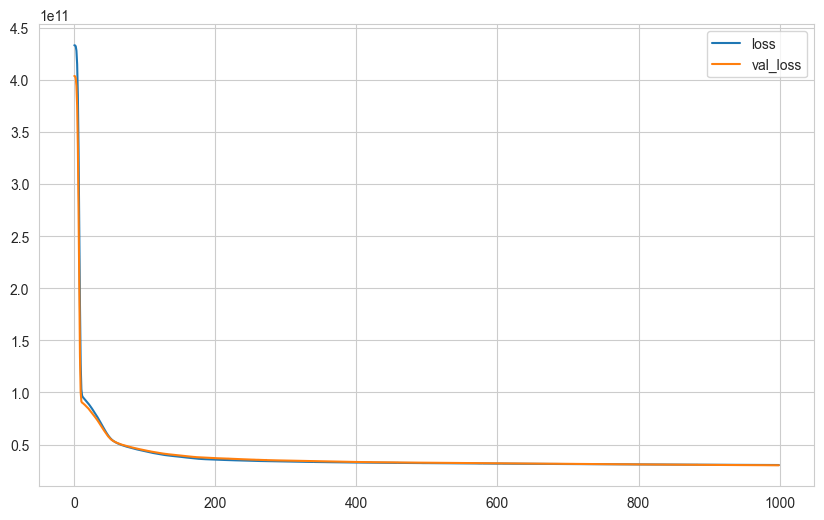

In [277]:
loss_df = pd.DataFrame(model.history.history)
loss_df.plot();

#  Loss ve val_loss değerlerinin plot'unu çizdirince ikisinin de birbirine paralel şekilde azalması istenen durumdur.
#  loss azalırkene belli noktadan sonra val_loss artışa geçse idi overfitting durumu var diyebilirdik.
    # Ancak bu overfitting durumunu önlemek için de "early stop" kullanabilirdik.

In [278]:
model.evaluate(X_test, y_test, verbose = 0)

25235587072.0

In [279]:
y_pred = model.predict(X_test)

68/68 [==============================] - 0s 661us/step


In [280]:
eval_metric(y_test, y_pred)

# Burada rmse =158857 . Yani evin fiyatını tahmin ederken yaklaşık +- 150 bin dolarlık hatamız var. 
# Bu rmse değeri çok fazla böyle bir hata payı kabul edilemez.
# r2 score'u artırmak ve rmse' yi azaltmak için learning rate üzerinde güncelleme yapacağız. Daha önce default değerle çalıştı.

r2_score: 0.7904422674170897 
mae: 102592.12077907987 
mse 25235585793.317825 
rmse: 158857.12383559582


### learning_rate

In [282]:
from tensorflow.keras.optimizers import Adam

In [301]:
tf.random.set_seed(seed)
tf.keras.backend.clear_session()

model = Sequential()
model.add(Dense(units = 24, activation = "relu", input_dim = X_train.shape[1]))
model.add(Dense(units = 16, activation = "relu"))
model.add(Dense(units = 8, activation = "relu"))
model.add(Dense(units = 4, activation = "relu"))
model.add(Dense(1))

opt = Adam(lr = 0.003) # default = 0.001
model.compile(optimizer = opt, loss = "mse")

# Burada learning-rate için en uygun değeri, deneme-yanılma yoluyla bulabilirz ya da GridSearch ile de bulabilirz.
# Ancak GridSearch çok ciddi bir işlem maliyeti getirdiği için genelde tercih edilmiyor. PC güçlü ise denenebilir.

In [302]:
model.weights

[<tf.Variable 'dense/kernel:0' shape=(16, 24) dtype=float32, numpy=
 array([[-0.07860523,  0.36023974,  0.16282248,  0.3221578 , -0.11790726,
         -0.12493446, -0.08824241,  0.02818274,  0.03210586,  0.16107386,
          0.34157264,  0.35162246, -0.02227172,  0.05922353, -0.02229112,
         -0.33558697,  0.01786393, -0.13079661,  0.18875158, -0.34797415,
          0.12334144,  0.06945813,  0.04263899, -0.37639853],
        [-0.27476364, -0.3826476 , -0.37294978, -0.03487712,  0.20596713,
         -0.10373119, -0.3199869 , -0.33946678,  0.38433987,  0.05827439,
          0.23453677,  0.23770261,  0.13764894, -0.0978393 , -0.09618735,
          0.20378691, -0.3589145 , -0.3516668 , -0.13042015,  0.30120248,
         -0.29599833, -0.16326812, -0.3809433 ,  0.11582869],
        [-0.23352352,  0.1482653 ,  0.0308747 , -0.07743734, -0.18914911,
          0.3591867 ,  0.05411893,  0.16235453, -0.3320379 ,  0.07663095,
         -0.11350343, -0.11356762,  0.13505262,  0.26859176,  0.0310

In [303]:
model.fit(x = X_train, y = y_train, validation_split = 0.15, batch_size = 128, epochs = 1000)

Epoch 1/1000
130/130 [==============================] - 0s 2ms/step - loss: 433153507328.0000 - val_loss: 402969657344.0000
Epoch 2/1000
130/130 [==============================] - 0s 1ms/step - loss: 419243294720.0000 - val_loss: 357091672064.0000
Epoch 3/1000
130/130 [==============================] - 0s 1ms/step - loss: 276500512768.0000 - val_loss: 132159168512.0000
Epoch 4/1000
130/130 [==============================] - 0s 1ms/step - loss: 105325502464.0000 - val_loss: 89970106368.0000
Epoch 5/1000
130/130 [==============================] - 0s 1ms/step - loss: 94258233344.0000 - val_loss: 88119140352.0000
Epoch 6/1000
130/130 [==============================] - 0s 1ms/step - loss: 91734048768.0000 - val_loss: 86474981376.0000
Epoch 7/1000
130/130 [==============================] - 0s 1ms/step - loss: 89219792896.0000 - val_loss: 83637665792.0000
Epoch 8/1000
130/130 [==============================] - 0s 1ms/step - loss: 86474334208.0000 - val_loss: 81668268032.0000
Epoch 9/1000
130/

130/130 [==============================] - 0s 1ms/step - loss: 35155406848.0000 - val_loss: 36387467264.0000
Epoch 68/1000
130/130 [==============================] - 0s 1ms/step - loss: 35074854912.0000 - val_loss: 36244905984.0000
Epoch 69/1000
130/130 [==============================] - 0s 1ms/step - loss: 35010412544.0000 - val_loss: 36277075968.0000
Epoch 70/1000
130/130 [==============================] - 0s 1ms/step - loss: 34895896576.0000 - val_loss: 36080963584.0000
Epoch 71/1000
130/130 [==============================] - 0s 1ms/step - loss: 34839535616.0000 - val_loss: 36099653632.0000
Epoch 72/1000
130/130 [==============================] - 0s 1ms/step - loss: 34812706816.0000 - val_loss: 35956969472.0000
Epoch 73/1000
130/130 [==============================] - 0s 1ms/step - loss: 34685423616.0000 - val_loss: 35815448576.0000
Epoch 74/1000
130/130 [==============================] - 0s 1ms/step - loss: 34631225344.0000 - val_loss: 35781001216.0000
Epoch 75/1000
130/130 [=======

130/130 [==============================] - 0s 1ms/step - loss: 32664035328.0000 - val_loss: 33091659776.0000
Epoch 134/1000
130/130 [==============================] - 0s 1ms/step - loss: 32639959040.0000 - val_loss: 33073565696.0000
Epoch 135/1000
130/130 [==============================] - 0s 1ms/step - loss: 32656025600.0000 - val_loss: 33034190848.0000
Epoch 136/1000
130/130 [==============================] - 0s 1ms/step - loss: 32619034624.0000 - val_loss: 32981725184.0000
Epoch 137/1000
130/130 [==============================] - 0s 1ms/step - loss: 32551507968.0000 - val_loss: 32980748288.0000
Epoch 138/1000
130/130 [==============================] - 0s 1ms/step - loss: 32593856512.0000 - val_loss: 32980969472.0000
Epoch 139/1000
130/130 [==============================] - 0s 1ms/step - loss: 32553547776.0000 - val_loss: 32873062400.0000
Epoch 140/1000
130/130 [==============================] - 0s 1ms/step - loss: 32510429184.0000 - val_loss: 32955316224.0000
Epoch 141/1000
130/130 

130/130 [==============================] - 0s 1ms/step - loss: 31562942464.0000 - val_loss: 31762954240.0000
Epoch 200/1000
130/130 [==============================] - 0s 1ms/step - loss: 31541950464.0000 - val_loss: 31793387520.0000
Epoch 201/1000
130/130 [==============================] - 0s 1ms/step - loss: 31533324288.0000 - val_loss: 31693129728.0000
Epoch 202/1000
130/130 [==============================] - 0s 1ms/step - loss: 31486318592.0000 - val_loss: 31731488768.0000
Epoch 203/1000
130/130 [==============================] - 0s 1ms/step - loss: 31565459456.0000 - val_loss: 31715962880.0000
Epoch 204/1000
130/130 [==============================] - 0s 1ms/step - loss: 31535415296.0000 - val_loss: 31652167680.0000
Epoch 205/1000
130/130 [==============================] - 0s 2ms/step - loss: 31495698432.0000 - val_loss: 31711758336.0000
Epoch 206/1000
130/130 [==============================] - 0s 1ms/step - loss: 31472881664.0000 - val_loss: 31676067840.0000
Epoch 207/1000
130/130 

130/130 [==============================] - 0s 1ms/step - loss: 30727561216.0000 - val_loss: 30553882624.0000
Epoch 266/1000
130/130 [==============================] - 0s 1ms/step - loss: 30681587712.0000 - val_loss: 30528071680.0000
Epoch 267/1000
130/130 [==============================] - 0s 1ms/step - loss: 30660050944.0000 - val_loss: 30498322432.0000
Epoch 268/1000
130/130 [==============================] - 0s 1ms/step - loss: 30624440320.0000 - val_loss: 30472118272.0000
Epoch 269/1000
130/130 [==============================] - 0s 1ms/step - loss: 30624178176.0000 - val_loss: 30511099904.0000
Epoch 270/1000
130/130 [==============================] - 0s 1ms/step - loss: 30607476736.0000 - val_loss: 30508040192.0000
Epoch 271/1000
130/130 [==============================] - 0s 1ms/step - loss: 30569879552.0000 - val_loss: 30465826816.0000
Epoch 272/1000
130/130 [==============================] - 0s 1ms/step - loss: 30601048064.0000 - val_loss: 30418827264.0000
Epoch 273/1000
130/130 

130/130 [==============================] - 0s 1ms/step - loss: 29925390336.0000 - val_loss: 29340637184.0000
Epoch 332/1000
130/130 [==============================] - 0s 1ms/step - loss: 29857796096.0000 - val_loss: 29341601792.0000
Epoch 333/1000
130/130 [==============================] - 0s 1ms/step - loss: 29878556672.0000 - val_loss: 29350123520.0000
Epoch 334/1000
130/130 [==============================] - 0s 1ms/step - loss: 29889816576.0000 - val_loss: 29305618432.0000
Epoch 335/1000
130/130 [==============================] - 0s 1ms/step - loss: 29855182848.0000 - val_loss: 29307385856.0000
Epoch 336/1000
130/130 [==============================] - 0s 1ms/step - loss: 29858011136.0000 - val_loss: 29273063424.0000
Epoch 337/1000
130/130 [==============================] - 0s 1ms/step - loss: 29804290048.0000 - val_loss: 29300936704.0000
Epoch 338/1000
130/130 [==============================] - 0s 1ms/step - loss: 29794236416.0000 - val_loss: 29333489664.0000
Epoch 339/1000
130/130 

130/130 [==============================] - 0s 1ms/step - loss: 29231470592.0000 - val_loss: 28596830208.0000
Epoch 398/1000
130/130 [==============================] - 0s 1ms/step - loss: 29204447232.0000 - val_loss: 28666533888.0000
Epoch 399/1000
130/130 [==============================] - 0s 1ms/step - loss: 29221711872.0000 - val_loss: 28625184768.0000
Epoch 400/1000
130/130 [==============================] - 0s 1ms/step - loss: 29277095936.0000 - val_loss: 28633495552.0000
Epoch 401/1000
130/130 [==============================] - 0s 1ms/step - loss: 29202817024.0000 - val_loss: 28697643008.0000
Epoch 402/1000
130/130 [==============================] - 0s 1ms/step - loss: 29173669888.0000 - val_loss: 28633139200.0000
Epoch 403/1000
130/130 [==============================] - 0s 1ms/step - loss: 29167968256.0000 - val_loss: 28654063616.0000
Epoch 404/1000
130/130 [==============================] - 0s 1ms/step - loss: 29144727552.0000 - val_loss: 28603832320.0000
Epoch 405/1000
130/130 

130/130 [==============================] - 0s 1ms/step - loss: 28786409472.0000 - val_loss: 28234964992.0000
Epoch 464/1000
130/130 [==============================] - 0s 1ms/step - loss: 28756408320.0000 - val_loss: 28174151680.0000
Epoch 465/1000
130/130 [==============================] - 0s 1ms/step - loss: 28728092672.0000 - val_loss: 28217473024.0000
Epoch 466/1000
130/130 [==============================] - 0s 1ms/step - loss: 28756918272.0000 - val_loss: 28226179072.0000
Epoch 467/1000
130/130 [==============================] - 0s 1ms/step - loss: 28740108288.0000 - val_loss: 28181207040.0000
Epoch 468/1000
130/130 [==============================] - 0s 1ms/step - loss: 28773070848.0000 - val_loss: 28242212864.0000
Epoch 469/1000
130/130 [==============================] - 0s 1ms/step - loss: 28750487552.0000 - val_loss: 28214163456.0000
Epoch 470/1000
130/130 [==============================] - 0s 1ms/step - loss: 28751597568.0000 - val_loss: 28275623936.0000
Epoch 471/1000
130/130 

130/130 [==============================] - 0s 1ms/step - loss: 28456517632.0000 - val_loss: 28233900032.0000
Epoch 530/1000
130/130 [==============================] - 0s 1ms/step - loss: 28539006976.0000 - val_loss: 28196110336.0000
Epoch 531/1000
130/130 [==============================] - 0s 1ms/step - loss: 28454514688.0000 - val_loss: 28115398656.0000
Epoch 532/1000
130/130 [==============================] - 0s 1ms/step - loss: 28437235712.0000 - val_loss: 27956193280.0000
Epoch 533/1000
130/130 [==============================] - 0s 1ms/step - loss: 28478478336.0000 - val_loss: 27993309184.0000
Epoch 534/1000
130/130 [==============================] - 0s 1ms/step - loss: 28476729344.0000 - val_loss: 27936757760.0000
Epoch 535/1000
130/130 [==============================] - 0s 1ms/step - loss: 28453453824.0000 - val_loss: 27998699520.0000
Epoch 536/1000
130/130 [==============================] - 0s 1ms/step - loss: 28419158016.0000 - val_loss: 27955066880.0000
Epoch 537/1000
130/130 

130/130 [==============================] - 0s 1ms/step - loss: 28007763968.0000 - val_loss: 27730767872.0000
Epoch 596/1000
130/130 [==============================] - 0s 1ms/step - loss: 27989938176.0000 - val_loss: 27482112000.0000
Epoch 597/1000
130/130 [==============================] - 0s 1ms/step - loss: 27996723200.0000 - val_loss: 27482535936.0000
Epoch 598/1000
130/130 [==============================] - 0s 1ms/step - loss: 27938590720.0000 - val_loss: 27475386368.0000
Epoch 599/1000
130/130 [==============================] - 0s 1ms/step - loss: 27886014464.0000 - val_loss: 27409405952.0000
Epoch 600/1000
130/130 [==============================] - 0s 1ms/step - loss: 27943720960.0000 - val_loss: 27450761216.0000
Epoch 601/1000
130/130 [==============================] - 0s 1ms/step - loss: 27862695936.0000 - val_loss: 27429517312.0000
Epoch 602/1000
130/130 [==============================] - 0s 1ms/step - loss: 27816982528.0000 - val_loss: 27547883520.0000
Epoch 603/1000
130/130 

130/130 [==============================] - 0s 1ms/step - loss: 23976443904.0000 - val_loss: 23089381376.0000
Epoch 662/1000
130/130 [==============================] - 0s 1ms/step - loss: 23880402944.0000 - val_loss: 23036819456.0000
Epoch 663/1000
130/130 [==============================] - 0s 1ms/step - loss: 23752466432.0000 - val_loss: 22861838336.0000
Epoch 664/1000
130/130 [==============================] - 0s 1ms/step - loss: 23753424896.0000 - val_loss: 22812026880.0000
Epoch 665/1000
130/130 [==============================] - 0s 1ms/step - loss: 23688620032.0000 - val_loss: 22733768704.0000
Epoch 666/1000
130/130 [==============================] - 0s 1ms/step - loss: 23615584256.0000 - val_loss: 22587054080.0000
Epoch 667/1000
130/130 [==============================] - 0s 1ms/step - loss: 23455678464.0000 - val_loss: 22608060416.0000
Epoch 668/1000
130/130 [==============================] - 0s 2ms/step - loss: 23375345664.0000 - val_loss: 22535180288.0000
Epoch 669/1000
130/130 

130/130 [==============================] - 0s 1ms/step - loss: 21132693504.0000 - val_loss: 19875307520.0000
Epoch 728/1000
130/130 [==============================] - 0s 1ms/step - loss: 21096404992.0000 - val_loss: 19936751616.0000
Epoch 729/1000
130/130 [==============================] - 0s 1ms/step - loss: 21077815296.0000 - val_loss: 19867138048.0000
Epoch 730/1000
130/130 [==============================] - 0s 1ms/step - loss: 21142450176.0000 - val_loss: 19875248128.0000
Epoch 731/1000
130/130 [==============================] - 0s 2ms/step - loss: 21000488960.0000 - val_loss: 19799492608.0000
Epoch 732/1000
130/130 [==============================] - 0s 1ms/step - loss: 20955152384.0000 - val_loss: 19723694080.0000
Epoch 733/1000
130/130 [==============================] - 0s 1ms/step - loss: 20989286400.0000 - val_loss: 19760252928.0000
Epoch 734/1000
130/130 [==============================] - 0s 1ms/step - loss: 20990576640.0000 - val_loss: 19686901760.0000
Epoch 735/1000
130/130 

130/130 [==============================] - 0s 1ms/step - loss: 20005482496.0000 - val_loss: 18919632896.0000
Epoch 794/1000
130/130 [==============================] - 0s 1ms/step - loss: 20002648064.0000 - val_loss: 18887174144.0000
Epoch 795/1000
130/130 [==============================] - 0s 1ms/step - loss: 20062398464.0000 - val_loss: 18985519104.0000
Epoch 796/1000
130/130 [==============================] - 0s 1ms/step - loss: 20001441792.0000 - val_loss: 18741309440.0000
Epoch 797/1000
130/130 [==============================] - 0s 1ms/step - loss: 20085198848.0000 - val_loss: 18708797440.0000
Epoch 798/1000
130/130 [==============================] - 0s 1ms/step - loss: 19952607232.0000 - val_loss: 18755479552.0000
Epoch 799/1000
130/130 [==============================] - 0s 1ms/step - loss: 19912892416.0000 - val_loss: 18770923520.0000
Epoch 800/1000
130/130 [==============================] - 0s 1ms/step - loss: 19884900352.0000 - val_loss: 18706970624.0000
Epoch 801/1000
130/130 

130/130 [==============================] - 0s 1ms/step - loss: 19397070848.0000 - val_loss: 18334459904.0000
Epoch 860/1000
130/130 [==============================] - 0s 1ms/step - loss: 19324444672.0000 - val_loss: 18365657088.0000
Epoch 861/1000
130/130 [==============================] - 0s 1ms/step - loss: 19382347776.0000 - val_loss: 18629898240.0000
Epoch 862/1000
130/130 [==============================] - 0s 1ms/step - loss: 19283777536.0000 - val_loss: 18633009152.0000
Epoch 863/1000
130/130 [==============================] - 0s 1ms/step - loss: 19333816320.0000 - val_loss: 18378063872.0000
Epoch 864/1000
130/130 [==============================] - 0s 1ms/step - loss: 19305306112.0000 - val_loss: 18585706496.0000
Epoch 865/1000
130/130 [==============================] - 0s 1ms/step - loss: 19345139712.0000 - val_loss: 18420154368.0000
Epoch 866/1000
130/130 [==============================] - 0s 1ms/step - loss: 19320508416.0000 - val_loss: 18772422656.0000
Epoch 867/1000
130/130 

130/130 [==============================] - 0s 1ms/step - loss: 18801739776.0000 - val_loss: 18010716160.0000
Epoch 926/1000
130/130 [==============================] - 0s 1ms/step - loss: 18776641536.0000 - val_loss: 18364651520.0000
Epoch 927/1000
130/130 [==============================] - 0s 1ms/step - loss: 18832594944.0000 - val_loss: 18282758144.0000
Epoch 928/1000
130/130 [==============================] - 0s 1ms/step - loss: 18820589568.0000 - val_loss: 18083028992.0000
Epoch 929/1000
130/130 [==============================] - 0s 1ms/step - loss: 18718384128.0000 - val_loss: 18111301632.0000
Epoch 930/1000
130/130 [==============================] - 0s 1ms/step - loss: 18743517184.0000 - val_loss: 18004738048.0000
Epoch 931/1000
130/130 [==============================] - 0s 1ms/step - loss: 18754129920.0000 - val_loss: 18150459392.0000
Epoch 932/1000
130/130 [==============================] - 0s 1ms/step - loss: 18773346304.0000 - val_loss: 18053994496.0000
Epoch 933/1000
130/130 

130/130 [==============================] - 0s 1ms/step - loss: 18581958656.0000 - val_loss: 17921607680.0000
Epoch 992/1000
130/130 [==============================] - 0s 1ms/step - loss: 18514593792.0000 - val_loss: 17966882816.0000
Epoch 993/1000
130/130 [==============================] - 0s 1ms/step - loss: 18305892352.0000 - val_loss: 17815519232.0000
Epoch 994/1000
130/130 [==============================] - 0s 1ms/step - loss: 18372530176.0000 - val_loss: 17821014016.0000
Epoch 995/1000
130/130 [==============================] - 0s 1ms/step - loss: 18321139712.0000 - val_loss: 17754206208.0000
Epoch 996/1000
130/130 [==============================] - 0s 1ms/step - loss: 18441095168.0000 - val_loss: 17848901632.0000
Epoch 997/1000
130/130 [==============================] - 0s 1ms/step - loss: 18341855232.0000 - val_loss: 17662107648.0000
Epoch 998/1000
130/130 [==============================] - 0s 1ms/step - loss: 18322593792.0000 - val_loss: 17731258368.0000
Epoch 999/1000
130/130 

<AxesSubplot:>

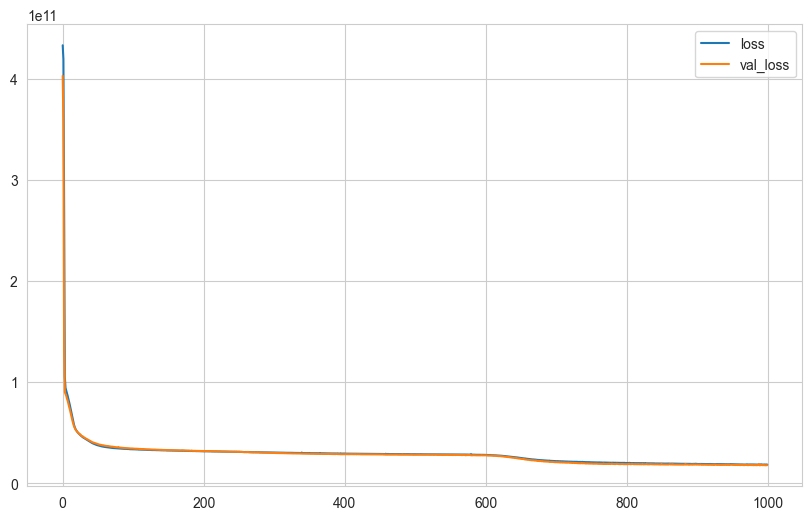

In [304]:
loss_df = pd.DataFrame(model.history.history)
loss_df.plot()

# Grafiğe bakınca 600'den hemen sonra sanki local minimumlardan birinden kurtulmuş gibi gözüküyor.

In [305]:
y_pred = model.predict(X_test)

68/68 [==============================] - 0s 698us/step


In [306]:
eval_metric(y_test, y_pred)
# r2 score'umuz 79'dan 86'ya çıkarken, rmse, 158 binden 126 bin sayısına geriledi.
# Score'daki iyileşmenin sebebi şu olabilir:
    # Learning rate artınca step size da büyür ve step size büyüdüğü için daha önce takıldığımız local minima'ya takılmadık.
    # Belki başka bir local minimum'a girdik. Bunu bilmiyoruz. Deneyerek bulacağız.
    # Modeli kurarken belirttiğimiz "seed" sabit kaldıkça hep aynı random noktadan harekete başlıyor.
    # Bu sayede modeli geliştirme fırsatı bulabiliyoruz. Ama ayrıca o random start point çok ters bir yerde de olabilir.
    # Bu konuda emin olmak zor. Bu alan biraz deneme yanılma alanı...

r2_score: 0.8675390568876131 
mae: 80058.71647497106 
mse 15951353610.174688 
rmse: 126298.66828345692


### EarlyStopping

In [307]:
# Bazen model epoch'ları yaparken belli bir epoch sayısından sonra loss değerleri azalmayı bırakır.
# Bu azalmanın durduğu noktada eğitimi durdurmak için early stop kullanırız.
# bu bize hem zaman kazandırır hem de model overfitting'e gidiyorsa bunu engellememizi sağlar.

from tensorflow.keras.callbacks import EarlyStopping

In [308]:
tf.random.set_seed(seed)
tf.keras.backend.clear_session()

model = Sequential()

model.add(Dense(24, activation = 'relu', input_dim = X_train.shape[1]))
model.add(Dense(24, activation = 'relu'))
model.add(Dense(12, activation = 'relu'))
model.add(Dense(6, activation = 'relu'))
model.add(Dense(1))

opt = Adam(lr = 0.003)
model.compile(optimizer = opt, loss = 'mse')

In [309]:
early_stop = EarlyStopping(monitor = "val_loss", mode = "min", verbose = 1, patience = 50, restore_best_weights = True)

# Burada "val_loss" değerini monitoring yapacağız yani val_loss değerine göre early stop yapacağız.
# patience = 50 demek, minimum_loss'u bulduğunda 50 epoch daha sabret hemen durdurma, 50 epoch daha iyileşme olmazasa durdur.
# restore_best_weights=True demek, en son epoch'daki değeri alma 50 epoch sabretmiştin ya oradaki en iyi score'u al demek.

In [310]:
model.fit(x = X_train, y = y_train, validation_split = 0.15, batch_size = 128, epochs = 1000, callbacks = [early_stop])
# Burada early stop'u callbacks içinde belirterek modeli buna göre çalıştır demiş olduk.
# Burada modelimizin 980'inci epoch'da earlytstopping yaptığını ve 930'uncu epoch'daki losss değeri aldığını gördük.
# Bu noktada en iyisi en başta epoch sayısını çok yüksek tutup bir grafiği görmek ve ondan sonra early_stop yapmak.
    # Çünkü belki 50 epoch yeterli değil ve 60 epoch sonra skor'da iyileşme olacaktı. Bir deneyelim bakalım !!!

Epoch 1/1000
130/130 [==============================] - 0s 2ms/step - loss: 432678338560.0000 - val_loss: 399537733632.0000
Epoch 2/1000
130/130 [==============================] - 0s 1ms/step - loss: 364009455616.0000 - val_loss: 198818824192.0000
Epoch 3/1000
130/130 [==============================] - 0s 1ms/step - loss: 116755144704.0000 - val_loss: 89674416128.0000
Epoch 4/1000
130/130 [==============================] - 0s 1ms/step - loss: 93002203136.0000 - val_loss: 86162227200.0000
Epoch 5/1000
130/130 [==============================] - 0s 1ms/step - loss: 89138339840.0000 - val_loss: 83202195456.0000
Epoch 6/1000
130/130 [==============================] - 0s 1ms/step - loss: 84948647936.0000 - val_loss: 80344104960.0000
Epoch 7/1000
130/130 [==============================] - 0s 1ms/step - loss: 80558374912.0000 - val_loss: 75206205440.0000
Epoch 8/1000
130/130 [==============================] - 0s 1ms/step - loss: 75581644800.0000 - val_loss: 71233241088.0000
Epoch 9/1000
130/13

130/130 [==============================] - 0s 1ms/step - loss: 33747517440.0000 - val_loss: 34512191488.0000
Epoch 68/1000
130/130 [==============================] - 0s 1ms/step - loss: 33692561408.0000 - val_loss: 34406375424.0000
Epoch 69/1000
130/130 [==============================] - 0s 1ms/step - loss: 33680717824.0000 - val_loss: 34470739968.0000
Epoch 70/1000
130/130 [==============================] - 0s 1ms/step - loss: 33571983360.0000 - val_loss: 34297073664.0000
Epoch 71/1000
130/130 [==============================] - 0s 1ms/step - loss: 33541892096.0000 - val_loss: 34461237248.0000
Epoch 72/1000
130/130 [==============================] - 0s 1ms/step - loss: 33575010304.0000 - val_loss: 34255599616.0000
Epoch 73/1000
130/130 [==============================] - 0s 1ms/step - loss: 33411702784.0000 - val_loss: 34130522112.0000
Epoch 74/1000
130/130 [==============================] - 0s 1ms/step - loss: 33377366016.0000 - val_loss: 34201436160.0000
Epoch 75/1000
130/130 [=======

130/130 [==============================] - 0s 1ms/step - loss: 31714211840.0000 - val_loss: 31810136064.0000
Epoch 134/1000
130/130 [==============================] - 0s 1ms/step - loss: 31693156352.0000 - val_loss: 31760271360.0000
Epoch 135/1000
130/130 [==============================] - 0s 1ms/step - loss: 31727603712.0000 - val_loss: 31840274432.0000
Epoch 136/1000
130/130 [==============================] - 0s 1ms/step - loss: 31686653952.0000 - val_loss: 31735013376.0000
Epoch 137/1000
130/130 [==============================] - 0s 1ms/step - loss: 31592865792.0000 - val_loss: 31753928704.0000
Epoch 138/1000
130/130 [==============================] - 0s 2ms/step - loss: 31623487488.0000 - val_loss: 31940440064.0000
Epoch 139/1000
130/130 [==============================] - 0s 1ms/step - loss: 31567761408.0000 - val_loss: 31595315200.0000
Epoch 140/1000
130/130 [==============================] - 0s 1ms/step - loss: 31557521408.0000 - val_loss: 31640506368.0000
Epoch 141/1000
130/130 

130/130 [==============================] - 0s 1ms/step - loss: 30230329344.0000 - val_loss: 29940727808.0000
Epoch 200/1000
130/130 [==============================] - 0s 1ms/step - loss: 30196324352.0000 - val_loss: 29976244224.0000
Epoch 201/1000
130/130 [==============================] - 0s 1ms/step - loss: 30172145664.0000 - val_loss: 29906167808.0000
Epoch 202/1000
130/130 [==============================] - 0s 1ms/step - loss: 30066634752.0000 - val_loss: 29837420544.0000
Epoch 203/1000
130/130 [==============================] - 0s 1ms/step - loss: 30146258944.0000 - val_loss: 29819715584.0000
Epoch 204/1000
130/130 [==============================] - 0s 1ms/step - loss: 30133862400.0000 - val_loss: 29705156608.0000
Epoch 205/1000
130/130 [==============================] - 0s 1ms/step - loss: 30067062784.0000 - val_loss: 29814376448.0000
Epoch 206/1000
130/130 [==============================] - 0s 1ms/step - loss: 29976735744.0000 - val_loss: 29752543232.0000
Epoch 207/1000
130/130 

130/130 [==============================] - 0s 1ms/step - loss: 28683794432.0000 - val_loss: 27971342336.0000
Epoch 266/1000
130/130 [==============================] - 0s 1ms/step - loss: 28599922688.0000 - val_loss: 27984019456.0000
Epoch 267/1000
130/130 [==============================] - 0s 1ms/step - loss: 28608931840.0000 - val_loss: 27862341632.0000
Epoch 268/1000
130/130 [==============================] - 0s 1ms/step - loss: 28526700544.0000 - val_loss: 27831339008.0000
Epoch 269/1000
130/130 [==============================] - 0s 1ms/step - loss: 28571750400.0000 - val_loss: 27963310080.0000
Epoch 270/1000
130/130 [==============================] - 0s 1ms/step - loss: 28536430592.0000 - val_loss: 27903254528.0000
Epoch 271/1000
130/130 [==============================] - 0s 1ms/step - loss: 28491743232.0000 - val_loss: 28004380672.0000
Epoch 272/1000
130/130 [==============================] - 0s 1ms/step - loss: 28537497600.0000 - val_loss: 27886368768.0000
Epoch 273/1000
130/130 

130/130 [==============================] - 0s 1ms/step - loss: 27393904640.0000 - val_loss: 26441885696.0000
Epoch 332/1000
130/130 [==============================] - 0s 1ms/step - loss: 27304724480.0000 - val_loss: 26375235584.0000
Epoch 333/1000
130/130 [==============================] - 0s 1ms/step - loss: 27303602176.0000 - val_loss: 26289256448.0000
Epoch 334/1000
130/130 [==============================] - 0s 1ms/step - loss: 27302205440.0000 - val_loss: 26259824640.0000
Epoch 335/1000
130/130 [==============================] - 0s 1ms/step - loss: 27245938688.0000 - val_loss: 26271117312.0000
Epoch 336/1000
130/130 [==============================] - 0s 1ms/step - loss: 27173292032.0000 - val_loss: 26518822912.0000
Epoch 337/1000
130/130 [==============================] - 0s 1ms/step - loss: 27114858496.0000 - val_loss: 26249140224.0000
Epoch 338/1000
130/130 [==============================] - 0s 1ms/step - loss: 27058053120.0000 - val_loss: 26422636544.0000
Epoch 339/1000
130/130 

130/130 [==============================] - 0s 1ms/step - loss: 22639370240.0000 - val_loss: 21309001728.0000
Epoch 398/1000
130/130 [==============================] - 0s 1ms/step - loss: 22611542016.0000 - val_loss: 21318359040.0000
Epoch 399/1000
130/130 [==============================] - 0s 1ms/step - loss: 22577793024.0000 - val_loss: 21256402944.0000
Epoch 400/1000
130/130 [==============================] - 0s 1ms/step - loss: 22610851840.0000 - val_loss: 21275095040.0000
Epoch 401/1000
130/130 [==============================] - 0s 1ms/step - loss: 22475841536.0000 - val_loss: 21202565120.0000
Epoch 402/1000
130/130 [==============================] - 0s 1ms/step - loss: 22367281152.0000 - val_loss: 20986892288.0000
Epoch 403/1000
130/130 [==============================] - 0s 1ms/step - loss: 22266372096.0000 - val_loss: 20935219200.0000
Epoch 404/1000
130/130 [==============================] - 0s 1ms/step - loss: 22277484544.0000 - val_loss: 20784187392.0000
Epoch 405/1000
130/130 

130/130 [==============================] - 0s 1ms/step - loss: 20553570304.0000 - val_loss: 18813779968.0000
Epoch 464/1000
130/130 [==============================] - 0s 1ms/step - loss: 20492494848.0000 - val_loss: 18645659648.0000
Epoch 465/1000
130/130 [==============================] - 0s 1ms/step - loss: 20463865856.0000 - val_loss: 18705428480.0000
Epoch 466/1000
130/130 [==============================] - 0s 1ms/step - loss: 20509753344.0000 - val_loss: 18737911808.0000
Epoch 467/1000
130/130 [==============================] - 0s 1ms/step - loss: 20438237184.0000 - val_loss: 18827065344.0000
Epoch 468/1000
130/130 [==============================] - 0s 1ms/step - loss: 20515651584.0000 - val_loss: 18703980544.0000
Epoch 469/1000
130/130 [==============================] - 0s 1ms/step - loss: 20446048256.0000 - val_loss: 18617016320.0000
Epoch 470/1000
130/130 [==============================] - 0s 1ms/step - loss: 20383596544.0000 - val_loss: 18558613504.0000
Epoch 471/1000
130/130 

130/130 [==============================] - 0s 1ms/step - loss: 19067262976.0000 - val_loss: 17504700416.0000
Epoch 530/1000
130/130 [==============================] - 0s 1ms/step - loss: 19043817472.0000 - val_loss: 17527001088.0000
Epoch 531/1000
130/130 [==============================] - 0s 1ms/step - loss: 18947436544.0000 - val_loss: 17738280960.0000
Epoch 532/1000
130/130 [==============================] - 0s 1ms/step - loss: 18893869056.0000 - val_loss: 17716017152.0000
Epoch 533/1000
130/130 [==============================] - 0s 1ms/step - loss: 18967285760.0000 - val_loss: 17360304128.0000
Epoch 534/1000
130/130 [==============================] - 0s 1ms/step - loss: 18952753152.0000 - val_loss: 17323767808.0000
Epoch 535/1000
130/130 [==============================] - 0s 1ms/step - loss: 18874122240.0000 - val_loss: 17530894336.0000
Epoch 536/1000
130/130 [==============================] - 0s 1ms/step - loss: 18896527360.0000 - val_loss: 17630461952.0000
Epoch 537/1000
130/130 

130/130 [==============================] - 0s 1ms/step - loss: 17772683264.0000 - val_loss: 16269899776.0000
Epoch 596/1000
130/130 [==============================] - 0s 1ms/step - loss: 17723234304.0000 - val_loss: 16268490752.0000
Epoch 597/1000
130/130 [==============================] - 0s 2ms/step - loss: 17703411712.0000 - val_loss: 16628015104.0000
Epoch 598/1000
130/130 [==============================] - 0s 1ms/step - loss: 17671276544.0000 - val_loss: 16250460160.0000
Epoch 599/1000
130/130 [==============================] - 0s 1ms/step - loss: 17565304832.0000 - val_loss: 16347740160.0000
Epoch 600/1000
130/130 [==============================] - 0s 1ms/step - loss: 17776138240.0000 - val_loss: 16327760896.0000
Epoch 601/1000
130/130 [==============================] - 0s 1ms/step - loss: 17574287360.0000 - val_loss: 16525931520.0000
Epoch 602/1000
130/130 [==============================] - 0s 1ms/step - loss: 17581453312.0000 - val_loss: 16337685504.0000
Epoch 603/1000
130/130 

130/130 [==============================] - 0s 1ms/step - loss: 16479585280.0000 - val_loss: 16036665344.0000
Epoch 662/1000
130/130 [==============================] - 0s 1ms/step - loss: 16546676736.0000 - val_loss: 15461224448.0000
Epoch 663/1000
130/130 [==============================] - 0s 1ms/step - loss: 16395437056.0000 - val_loss: 15824468992.0000
Epoch 664/1000
130/130 [==============================] - 0s 1ms/step - loss: 16519299072.0000 - val_loss: 15354828800.0000
Epoch 665/1000
130/130 [==============================] - 0s 1ms/step - loss: 16500348928.0000 - val_loss: 16167242752.0000
Epoch 666/1000
130/130 [==============================] - 0s 1ms/step - loss: 16593211392.0000 - val_loss: 15416904704.0000
Epoch 667/1000
130/130 [==============================] - 0s 1ms/step - loss: 16334253056.0000 - val_loss: 15622660096.0000
Epoch 668/1000
130/130 [==============================] - 0s 1ms/step - loss: 16392059904.0000 - val_loss: 15294568448.0000
Epoch 669/1000
130/130 

130/130 [==============================] - 0s 1ms/step - loss: 15357393920.0000 - val_loss: 14584871936.0000
Epoch 728/1000
130/130 [==============================] - 0s 1ms/step - loss: 15323550720.0000 - val_loss: 14705298432.0000
Epoch 729/1000
130/130 [==============================] - 0s 1ms/step - loss: 15376178176.0000 - val_loss: 14544416768.0000
Epoch 730/1000
130/130 [==============================] - 0s 1ms/step - loss: 15433701376.0000 - val_loss: 14595050496.0000
Epoch 731/1000
130/130 [==============================] - 0s 1ms/step - loss: 15327919104.0000 - val_loss: 14567482368.0000
Epoch 732/1000
130/130 [==============================] - 0s 1ms/step - loss: 15193415680.0000 - val_loss: 14698342400.0000
Epoch 733/1000
130/130 [==============================] - 0s 2ms/step - loss: 15179038720.0000 - val_loss: 14713963520.0000
Epoch 734/1000
130/130 [==============================] - 0s 2ms/step - loss: 15192875008.0000 - val_loss: 14769541120.0000
Epoch 735/1000
130/130 

130/130 [==============================] - 0s 1ms/step - loss: 14491826176.0000 - val_loss: 14282543104.0000
Epoch 794/1000
130/130 [==============================] - 0s 1ms/step - loss: 14588290048.0000 - val_loss: 14118919168.0000
Epoch 795/1000
130/130 [==============================] - 0s 1ms/step - loss: 14834338816.0000 - val_loss: 14882339840.0000
Epoch 796/1000
130/130 [==============================] - 0s 1ms/step - loss: 14552353792.0000 - val_loss: 14370919424.0000
Epoch 797/1000
130/130 [==============================] - 0s 1ms/step - loss: 14935623680.0000 - val_loss: 14094280704.0000
Epoch 798/1000
130/130 [==============================] - 0s 1ms/step - loss: 14522931200.0000 - val_loss: 14204987392.0000
Epoch 799/1000
130/130 [==============================] - 0s 1ms/step - loss: 14441670656.0000 - val_loss: 14319876096.0000
Epoch 800/1000
130/130 [==============================] - 0s 1ms/step - loss: 14379283456.0000 - val_loss: 13987002368.0000
Epoch 801/1000
130/130 

130/130 [==============================] - 0s 1ms/step - loss: 14033529856.0000 - val_loss: 13925956608.0000
Epoch 860/1000
130/130 [==============================] - 0s 1ms/step - loss: 13965944832.0000 - val_loss: 13874826240.0000
Epoch 861/1000
130/130 [==============================] - 0s 1ms/step - loss: 14070116352.0000 - val_loss: 14487811072.0000
Epoch 862/1000
130/130 [==============================] - 0s 1ms/step - loss: 14047667200.0000 - val_loss: 14192195584.0000
Epoch 863/1000
130/130 [==============================] - 0s 1ms/step - loss: 13981197312.0000 - val_loss: 13983589376.0000
Epoch 864/1000
130/130 [==============================] - 0s 1ms/step - loss: 14023229440.0000 - val_loss: 14538594304.0000
Epoch 865/1000
130/130 [==============================] - 0s 1ms/step - loss: 14030862336.0000 - val_loss: 13774593024.0000
Epoch 866/1000
130/130 [==============================] - 0s 2ms/step - loss: 13985892352.0000 - val_loss: 15037717504.0000
Epoch 867/1000
130/130 

130/130 [==============================] - 0s 1ms/step - loss: 13984531456.0000 - val_loss: 13826243584.0000
Epoch 926/1000
130/130 [==============================] - 0s 1ms/step - loss: 13563713536.0000 - val_loss: 14246049792.0000
Epoch 927/1000
130/130 [==============================] - 0s 1ms/step - loss: 13726310400.0000 - val_loss: 13927911424.0000
Epoch 928/1000
130/130 [==============================] - 0s 1ms/step - loss: 13880320000.0000 - val_loss: 13752990720.0000
Epoch 929/1000
130/130 [==============================] - 0s 1ms/step - loss: 13583588352.0000 - val_loss: 13719927808.0000
Epoch 930/1000
130/130 [==============================] - 0s 1ms/step - loss: 13633435648.0000 - val_loss: 13494173696.0000
Epoch 931/1000
130/130 [==============================] - 0s 1ms/step - loss: 13588291584.0000 - val_loss: 13729864704.0000
Epoch 932/1000
130/130 [==============================] - 0s 1ms/step - loss: 13600716800.0000 - val_loss: 13706870784.0000
Epoch 933/1000
130/130 

<AxesSubplot:>

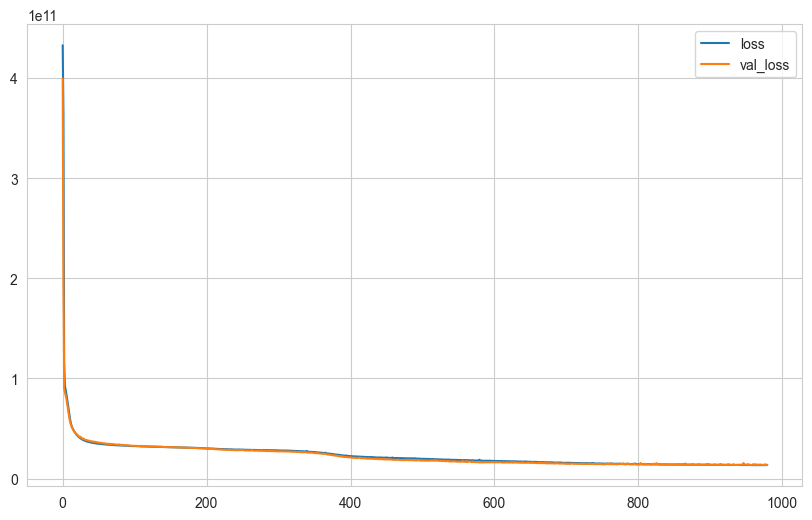

In [311]:
loss_df = pd.DataFrame(model.history.history)
loss_df.plot()

In [312]:
y_pred = model.predict(X_test)

68/68 [==============================] - 0s 672us/step


In [313]:
eval_metric(y_test, y_pred)

r2_score: 0.8957923528281222 
mae: 72207.6851707176 
mse 12549004935.83682 
rmse: 112022.34123529476


In [314]:
tf.random.set_seed(seed)
tf.keras.backend.clear_session()

model = Sequential()

model.add(Dense(24, activation = 'relu', input_dim = X_train.shape[1]))
model.add(Dense(24, activation = 'relu'))
model.add(Dense(12, activation = 'relu'))
model.add(Dense(6, activation = 'relu'))
model.add(Dense(1))

opt = Adam(lr = 0.003)
model.compile(optimizer = opt, loss = 'mse')

In [315]:
model.fit(x = X_train, y = y_train, validation_split = 0.15, batch_size = 128, epochs = 2000)

Epoch 1/2000
130/130 [==============================] - 0s 2ms/step - loss: 433170710528.0000 - val_loss: 402938658816.0000
Epoch 2/2000
130/130 [==============================] - 0s 1ms/step - loss: 409556385792.0000 - val_loss: 319199870976.0000
Epoch 3/2000
130/130 [==============================] - 0s 1ms/step - loss: 195160129536.0000 - val_loss: 91175960576.0000
Epoch 4/2000
130/130 [==============================] - 0s 1ms/step - loss: 95515222016.0000 - val_loss: 88601706496.0000
Epoch 5/2000
130/130 [==============================] - 0s 1ms/step - loss: 92408954880.0000 - val_loss: 86307127296.0000
Epoch 6/2000
130/130 [==============================] - 0s 1ms/step - loss: 89182691328.0000 - val_loss: 84213874688.0000
Epoch 7/2000
130/130 [==============================] - 0s 1ms/step - loss: 85924487168.0000 - val_loss: 80405880832.0000
Epoch 8/2000
130/130 [==============================] - 0s 1ms/step - loss: 82300960768.0000 - val_loss: 77706248192.0000
Epoch 9/2000
130/13

130/130 [==============================] - 0s 1ms/step - loss: 34653048832.0000 - val_loss: 35759312896.0000
Epoch 68/2000
130/130 [==============================] - 0s 1ms/step - loss: 34586107904.0000 - val_loss: 35640872960.0000
Epoch 69/2000
130/130 [==============================] - 0s 1ms/step - loss: 34547707904.0000 - val_loss: 35704545280.0000
Epoch 70/2000
130/130 [==============================] - 0s 1ms/step - loss: 34444922880.0000 - val_loss: 35505639424.0000
Epoch 71/2000
130/130 [==============================] - 0s 1ms/step - loss: 34404200448.0000 - val_loss: 35592753152.0000
Epoch 72/2000
130/130 [==============================] - 0s 2ms/step - loss: 34405380096.0000 - val_loss: 35430596608.0000
Epoch 73/2000
130/130 [==============================] - 0s 1ms/step - loss: 34271393792.0000 - val_loss: 35302096896.0000
Epoch 74/2000
130/130 [==============================] - 0s 1ms/step - loss: 34230525952.0000 - val_loss: 35314970624.0000
Epoch 75/2000
130/130 [=======

130/130 [==============================] - 0s 1ms/step - loss: 32363866112.0000 - val_loss: 32750921728.0000
Epoch 134/2000
130/130 [==============================] - 0s 1ms/step - loss: 32338604032.0000 - val_loss: 32717398016.0000
Epoch 135/2000
130/130 [==============================] - 0s 1ms/step - loss: 32358029312.0000 - val_loss: 32725643264.0000
Epoch 136/2000
130/130 [==============================] - 0s 1ms/step - loss: 32321103872.0000 - val_loss: 32629944320.0000
Epoch 137/2000
130/130 [==============================] - 0s 1ms/step - loss: 32240216064.0000 - val_loss: 32625629184.0000
Epoch 138/2000
130/130 [==============================] - 0s 1ms/step - loss: 32275658752.0000 - val_loss: 32716038144.0000
Epoch 139/2000
130/130 [==============================] - 0s 1ms/step - loss: 32226992128.0000 - val_loss: 32512227328.0000
Epoch 140/2000
130/130 [==============================] - 0s 1ms/step - loss: 32195196928.0000 - val_loss: 32581117952.0000
Epoch 141/2000
130/130 

130/130 [==============================] - 0s 1ms/step - loss: 31127121920.0000 - val_loss: 31148455936.0000
Epoch 200/2000
130/130 [==============================] - 0s 1ms/step - loss: 31113926656.0000 - val_loss: 31202527232.0000
Epoch 201/2000
130/130 [==============================] - 0s 1ms/step - loss: 31107930112.0000 - val_loss: 31081461760.0000
Epoch 202/2000
130/130 [==============================] - 0s 1ms/step - loss: 31049566208.0000 - val_loss: 31093350400.0000
Epoch 203/2000
130/130 [==============================] - 0s 2ms/step - loss: 31135666176.0000 - val_loss: 31081328640.0000
Epoch 204/2000
130/130 [==============================] - 0s 1ms/step - loss: 31111491584.0000 - val_loss: 31019558912.0000
Epoch 205/2000
130/130 [==============================] - 0s 1ms/step - loss: 31068291072.0000 - val_loss: 31087583232.0000
Epoch 206/2000
130/130 [==============================] - 0s 2ms/step - loss: 31033604096.0000 - val_loss: 31048222720.0000
Epoch 207/2000
130/130 

130/130 [==============================] - 0s 1ms/step - loss: 30340784128.0000 - val_loss: 29915842560.0000
Epoch 266/2000
130/130 [==============================] - 0s 1ms/step - loss: 30288185344.0000 - val_loss: 29901176832.0000
Epoch 267/2000
130/130 [==============================] - 0s 1ms/step - loss: 30266339328.0000 - val_loss: 29883207680.0000
Epoch 268/2000
130/130 [==============================] - 0s 1ms/step - loss: 30228439040.0000 - val_loss: 29852823552.0000
Epoch 269/2000
130/130 [==============================] - 0s 1ms/step - loss: 30232903680.0000 - val_loss: 29930254336.0000
Epoch 270/2000
130/130 [==============================] - 0s 1ms/step - loss: 30217117696.0000 - val_loss: 29917124608.0000
Epoch 271/2000
130/130 [==============================] - 0s 1ms/step - loss: 30174427136.0000 - val_loss: 29881649152.0000
Epoch 272/2000
130/130 [==============================] - 0s 1ms/step - loss: 30219110400.0000 - val_loss: 29798139904.0000
Epoch 273/2000
130/130 

130/130 [==============================] - 0s 1ms/step - loss: 29581613056.0000 - val_loss: 28987355136.0000
Epoch 332/2000
130/130 [==============================] - 0s 1ms/step - loss: 29492668416.0000 - val_loss: 28933939200.0000
Epoch 333/2000
130/130 [==============================] - 0s 1ms/step - loss: 29529860096.0000 - val_loss: 28924921856.0000
Epoch 334/2000
130/130 [==============================] - 0s 1ms/step - loss: 29535184896.0000 - val_loss: 28889776128.0000
Epoch 335/2000
130/130 [==============================] - 0s 1ms/step - loss: 29510989824.0000 - val_loss: 28921604096.0000
Epoch 336/2000
130/130 [==============================] - 0s 1ms/step - loss: 29505687552.0000 - val_loss: 28905897984.0000
Epoch 337/2000
130/130 [==============================] - 0s 1ms/step - loss: 29449840640.0000 - val_loss: 28889909248.0000
Epoch 338/2000
130/130 [==============================] - 0s 1ms/step - loss: 29447204864.0000 - val_loss: 28984055808.0000
Epoch 339/2000
130/130 

130/130 [==============================] - 0s 1ms/step - loss: 29001746432.0000 - val_loss: 28275888128.0000
Epoch 398/2000
130/130 [==============================] - 0s 1ms/step - loss: 28987299840.0000 - val_loss: 28364754944.0000
Epoch 399/2000
130/130 [==============================] - 0s 1ms/step - loss: 29004992512.0000 - val_loss: 28332693504.0000
Epoch 400/2000
130/130 [==============================] - 0s 1ms/step - loss: 29087709184.0000 - val_loss: 28327907328.0000
Epoch 401/2000
130/130 [==============================] - 0s 2ms/step - loss: 29004691456.0000 - val_loss: 28370757632.0000
Epoch 402/2000
130/130 [==============================] - 0s 1ms/step - loss: 28951369728.0000 - val_loss: 28279793664.0000
Epoch 403/2000
130/130 [==============================] - 0s 1ms/step - loss: 28954109952.0000 - val_loss: 28295870464.0000
Epoch 404/2000
130/130 [==============================] - 0s 1ms/step - loss: 28927477760.0000 - val_loss: 28284229632.0000
Epoch 405/2000
130/130 

130/130 [==============================] - 0s 1ms/step - loss: 28674080768.0000 - val_loss: 27942039552.0000
Epoch 464/2000
130/130 [==============================] - 0s 1ms/step - loss: 28641193984.0000 - val_loss: 27863257088.0000
Epoch 465/2000
130/130 [==============================] - 0s 1ms/step - loss: 28604006400.0000 - val_loss: 27881605120.0000
Epoch 466/2000
130/130 [==============================] - 0s 1ms/step - loss: 28656869376.0000 - val_loss: 27969423360.0000
Epoch 467/2000
130/130 [==============================] - 0s 1ms/step - loss: 28623484928.0000 - val_loss: 27852892160.0000
Epoch 468/2000
130/130 [==============================] - 0s 1ms/step - loss: 28676235264.0000 - val_loss: 27912640512.0000
Epoch 469/2000
130/130 [==============================] - 0s 1ms/step - loss: 28645595136.0000 - val_loss: 27880169472.0000
Epoch 470/2000
130/130 [==============================] - 0s 1ms/step - loss: 28633274368.0000 - val_loss: 27891056640.0000
Epoch 471/2000
130/130 

130/130 [==============================] - 0s 1ms/step - loss: 28397944832.0000 - val_loss: 28054798336.0000
Epoch 530/2000
130/130 [==============================] - 0s 1ms/step - loss: 28530460672.0000 - val_loss: 27894040576.0000
Epoch 531/2000
130/130 [==============================] - 0s 1ms/step - loss: 28428304384.0000 - val_loss: 27784382464.0000
Epoch 532/2000
130/130 [==============================] - 0s 1ms/step - loss: 28405852160.0000 - val_loss: 27631831040.0000
Epoch 533/2000
130/130 [==============================] - 0s 1ms/step - loss: 28470626304.0000 - val_loss: 27684532224.0000
Epoch 534/2000
130/130 [==============================] - 0s 1ms/step - loss: 28453277696.0000 - val_loss: 27598696448.0000
Epoch 535/2000
130/130 [==============================] - 0s 1ms/step - loss: 28419639296.0000 - val_loss: 27632486400.0000
Epoch 536/2000
130/130 [==============================] - 0s 1ms/step - loss: 28393625600.0000 - val_loss: 27666305024.0000
Epoch 537/2000
130/130 

130/130 [==============================] - 0s 1ms/step - loss: 28270397440.0000 - val_loss: 27866443776.0000
Epoch 596/2000
130/130 [==============================] - 0s 1ms/step - loss: 28264722432.0000 - val_loss: 27430785024.0000
Epoch 597/2000
130/130 [==============================] - 0s 1ms/step - loss: 28275386368.0000 - val_loss: 27462717440.0000
Epoch 598/2000
130/130 [==============================] - 0s 1ms/step - loss: 28256120832.0000 - val_loss: 27494936576.0000
Epoch 599/2000
130/130 [==============================] - 0s 1ms/step - loss: 28203718656.0000 - val_loss: 27425636352.0000
Epoch 600/2000
130/130 [==============================] - 0s 1ms/step - loss: 28280713216.0000 - val_loss: 27450576896.0000
Epoch 601/2000
130/130 [==============================] - 0s 1ms/step - loss: 28230494208.0000 - val_loss: 27429789696.0000
Epoch 602/2000
130/130 [==============================] - 0s 1ms/step - loss: 28201897984.0000 - val_loss: 27648212992.0000
Epoch 603/2000
130/130 

130/130 [==============================] - 0s 1ms/step - loss: 28136830976.0000 - val_loss: 27396689920.0000
Epoch 662/2000
130/130 [==============================] - 0s 1ms/step - loss: 28105785344.0000 - val_loss: 27335620608.0000
Epoch 663/2000
130/130 [==============================] - 0s 1ms/step - loss: 28081340416.0000 - val_loss: 27359494144.0000
Epoch 664/2000
130/130 [==============================] - 0s 1ms/step - loss: 28147210240.0000 - val_loss: 27386169344.0000
Epoch 665/2000
130/130 [==============================] - 0s 1ms/step - loss: 28192116736.0000 - val_loss: 27454251008.0000
Epoch 666/2000
130/130 [==============================] - 0s 1ms/step - loss: 28159776768.0000 - val_loss: 27341524992.0000
Epoch 667/2000
130/130 [==============================] - 0s 1ms/step - loss: 28064450560.0000 - val_loss: 27485118464.0000
Epoch 668/2000
130/130 [==============================] - 0s 1ms/step - loss: 28069844992.0000 - val_loss: 27397101568.0000
Epoch 669/2000
130/130 

130/130 [==============================] - 0s 1ms/step - loss: 28047349760.0000 - val_loss: 27219718144.0000
Epoch 728/2000
130/130 [==============================] - 0s 1ms/step - loss: 28065671168.0000 - val_loss: 27581388800.0000
Epoch 729/2000
130/130 [==============================] - 0s 1ms/step - loss: 27983659008.0000 - val_loss: 27203031040.0000
Epoch 730/2000
130/130 [==============================] - 0s 1ms/step - loss: 28138487808.0000 - val_loss: 27274420224.0000
Epoch 731/2000
130/130 [==============================] - 0s 1ms/step - loss: 27986900992.0000 - val_loss: 27248451584.0000
Epoch 732/2000
130/130 [==============================] - 0s 1ms/step - loss: 27958738944.0000 - val_loss: 27186126848.0000
Epoch 733/2000
130/130 [==============================] - 0s 1ms/step - loss: 27960670208.0000 - val_loss: 27299237888.0000
Epoch 734/2000
130/130 [==============================] - 0s 1ms/step - loss: 28031993856.0000 - val_loss: 27158493184.0000
Epoch 735/2000
130/130 

130/130 [==============================] - 0s 1ms/step - loss: 27891916800.0000 - val_loss: 27293073408.0000
Epoch 794/2000
130/130 [==============================] - 0s 1ms/step - loss: 27964846080.0000 - val_loss: 27187466240.0000
Epoch 795/2000
130/130 [==============================] - 0s 1ms/step - loss: 28021174272.0000 - val_loss: 27100868608.0000
Epoch 796/2000
130/130 [==============================] - 0s 1ms/step - loss: 27906170880.0000 - val_loss: 27184478208.0000
Epoch 797/2000
130/130 [==============================] - 0s 1ms/step - loss: 28002654208.0000 - val_loss: 27105392640.0000
Epoch 798/2000
130/130 [==============================] - 0s 1ms/step - loss: 27894456320.0000 - val_loss: 27173070848.0000
Epoch 799/2000
130/130 [==============================] - 0s 1ms/step - loss: 27868303360.0000 - val_loss: 27150987264.0000
Epoch 800/2000
130/130 [==============================] - 0s 1ms/step - loss: 27876007936.0000 - val_loss: 27094251520.0000
Epoch 801/2000
130/130 

130/130 [==============================] - 0s 1ms/step - loss: 27914745856.0000 - val_loss: 26989441024.0000
Epoch 860/2000
130/130 [==============================] - 0s 1ms/step - loss: 27815786496.0000 - val_loss: 26926727168.0000
Epoch 861/2000
130/130 [==============================] - 0s 1ms/step - loss: 27868661760.0000 - val_loss: 26987397120.0000
Epoch 862/2000
130/130 [==============================] - 0s 1ms/step - loss: 27822749696.0000 - val_loss: 27104014336.0000
Epoch 863/2000
130/130 [==============================] - 0s 1ms/step - loss: 27848198144.0000 - val_loss: 27038752768.0000
Epoch 864/2000
130/130 [==============================] - 0s 1ms/step - loss: 27866945536.0000 - val_loss: 27106324480.0000
Epoch 865/2000
130/130 [==============================] - 0s 1ms/step - loss: 27858909184.0000 - val_loss: 27230027776.0000
Epoch 866/2000
130/130 [==============================] - 0s 1ms/step - loss: 27884455936.0000 - val_loss: 27068590080.0000
Epoch 867/2000
130/130 

130/130 [==============================] - 0s 1ms/step - loss: 27775246336.0000 - val_loss: 26921644032.0000
Epoch 926/2000
130/130 [==============================] - 0s 1ms/step - loss: 27758376960.0000 - val_loss: 26995431424.0000
Epoch 927/2000
130/130 [==============================] - 0s 1ms/step - loss: 27804815360.0000 - val_loss: 27004372992.0000
Epoch 928/2000
130/130 [==============================] - 0s 1ms/step - loss: 27769024512.0000 - val_loss: 26910941184.0000
Epoch 929/2000
130/130 [==============================] - 0s 1ms/step - loss: 27696805888.0000 - val_loss: 27050055680.0000
Epoch 930/2000
130/130 [==============================] - 0s 1ms/step - loss: 27771299840.0000 - val_loss: 26930782208.0000
Epoch 931/2000
130/130 [==============================] - 0s 1ms/step - loss: 27783763968.0000 - val_loss: 27119828992.0000
Epoch 932/2000
130/130 [==============================] - 0s 1ms/step - loss: 27810287616.0000 - val_loss: 26982840320.0000
Epoch 933/2000
130/130 

130/130 [==============================] - 0s 1ms/step - loss: 27936770048.0000 - val_loss: 27014830080.0000
Epoch 992/2000
130/130 [==============================] - 0s 1ms/step - loss: 27798398976.0000 - val_loss: 27123412992.0000
Epoch 993/2000
130/130 [==============================] - 0s 1ms/step - loss: 27621992448.0000 - val_loss: 27064385536.0000
Epoch 994/2000
130/130 [==============================] - 0s 1ms/step - loss: 27743916032.0000 - val_loss: 26956969984.0000
Epoch 995/2000
130/130 [==============================] - 0s 1ms/step - loss: 27652265984.0000 - val_loss: 26937059328.0000
Epoch 996/2000
130/130 [==============================] - 0s 1ms/step - loss: 27786747904.0000 - val_loss: 27367430144.0000
Epoch 997/2000
130/130 [==============================] - 0s 1ms/step - loss: 27729981440.0000 - val_loss: 26925801472.0000
Epoch 998/2000
130/130 [==============================] - 0s 1ms/step - loss: 27648874496.0000 - val_loss: 26892113920.0000
Epoch 999/2000
130/130 

Epoch 1057/2000
130/130 [==============================] - 0s 1ms/step - loss: 27684655104.0000 - val_loss: 26866761728.0000
Epoch 1058/2000
130/130 [==============================] - 0s 1ms/step - loss: 27686887424.0000 - val_loss: 26953281536.0000
Epoch 1059/2000
130/130 [==============================] - 0s 1ms/step - loss: 27705038848.0000 - val_loss: 26939074560.0000
Epoch 1060/2000
130/130 [==============================] - 0s 1ms/step - loss: 27627700224.0000 - val_loss: 26837780480.0000
Epoch 1061/2000
130/130 [==============================] - 0s 1ms/step - loss: 27646179328.0000 - val_loss: 26817753088.0000
Epoch 1062/2000
130/130 [==============================] - 0s 1ms/step - loss: 27675406336.0000 - val_loss: 26951315456.0000
Epoch 1063/2000
130/130 [==============================] - 0s 1ms/step - loss: 27671169024.0000 - val_loss: 26918039552.0000
Epoch 1064/2000
130/130 [==============================] - 0s 1ms/step - loss: 27678035968.0000 - val_loss: 26873483264.0000


130/130 [==============================] - 0s 1ms/step - loss: 27656077312.0000 - val_loss: 26997291008.0000
Epoch 1123/2000
130/130 [==============================] - 0s 1ms/step - loss: 27632975872.0000 - val_loss: 26914410496.0000
Epoch 1124/2000
130/130 [==============================] - 0s 1ms/step - loss: 27681978368.0000 - val_loss: 26912737280.0000
Epoch 1125/2000
130/130 [==============================] - 0s 1ms/step - loss: 27590600704.0000 - val_loss: 26778462208.0000
Epoch 1126/2000
130/130 [==============================] - 0s 1ms/step - loss: 27670984704.0000 - val_loss: 26812948480.0000
Epoch 1127/2000
130/130 [==============================] - 0s 1ms/step - loss: 27586961408.0000 - val_loss: 26879131648.0000
Epoch 1128/2000
130/130 [==============================] - 0s 1ms/step - loss: 27684421632.0000 - val_loss: 26854014976.0000
Epoch 1129/2000
130/130 [==============================] - 0s 1ms/step - loss: 27599335424.0000 - val_loss: 26809872384.0000
Epoch 1130/2000


130/130 [==============================] - 0s 1ms/step - loss: 27510599680.0000 - val_loss: 27012939776.0000
Epoch 1188/2000
130/130 [==============================] - 0s 1ms/step - loss: 27563405312.0000 - val_loss: 26909995008.0000
Epoch 1189/2000
130/130 [==============================] - 0s 1ms/step - loss: 27552092160.0000 - val_loss: 26914451456.0000
Epoch 1190/2000
130/130 [==============================] - 0s 1ms/step - loss: 27548141568.0000 - val_loss: 26806697984.0000
Epoch 1191/2000
130/130 [==============================] - 0s 1ms/step - loss: 27632687104.0000 - val_loss: 26805123072.0000
Epoch 1192/2000
130/130 [==============================] - 0s 1ms/step - loss: 27571986432.0000 - val_loss: 26827038720.0000
Epoch 1193/2000
130/130 [==============================] - 0s 1ms/step - loss: 27650297856.0000 - val_loss: 26798972928.0000
Epoch 1194/2000
130/130 [==============================] - 0s 1ms/step - loss: 27544315904.0000 - val_loss: 26850539520.0000
Epoch 1195/2000


130/130 [==============================] - 0s 1ms/step - loss: 27639259136.0000 - val_loss: 26914004992.0000
Epoch 1253/2000
130/130 [==============================] - 0s 1ms/step - loss: 27501723648.0000 - val_loss: 26778812416.0000
Epoch 1254/2000
130/130 [==============================] - 0s 1ms/step - loss: 27525752832.0000 - val_loss: 27183228928.0000
Epoch 1255/2000
130/130 [==============================] - 0s 1ms/step - loss: 27494778880.0000 - val_loss: 26953971712.0000
Epoch 1256/2000
130/130 [==============================] - 0s 1ms/step - loss: 27535980544.0000 - val_loss: 26935224320.0000
Epoch 1257/2000
130/130 [==============================] - 0s 1ms/step - loss: 27534723072.0000 - val_loss: 26767955968.0000
Epoch 1258/2000
130/130 [==============================] - 0s 1ms/step - loss: 27525535744.0000 - val_loss: 26899591168.0000
Epoch 1259/2000
130/130 [==============================] - 0s 1ms/step - loss: 27585169408.0000 - val_loss: 26842607616.0000
Epoch 1260/2000


130/130 [==============================] - 0s 1ms/step - loss: 27469113344.0000 - val_loss: 27193438208.0000
Epoch 1318/2000
130/130 [==============================] - 0s 1ms/step - loss: 27524814848.0000 - val_loss: 27000455168.0000
Epoch 1319/2000
130/130 [==============================] - 0s 1ms/step - loss: 27454363648.0000 - val_loss: 26921287680.0000
Epoch 1320/2000
130/130 [==============================] - 0s 1ms/step - loss: 27504318464.0000 - val_loss: 27136356352.0000
Epoch 1321/2000
130/130 [==============================] - 0s 1ms/step - loss: 27485683712.0000 - val_loss: 26995017728.0000
Epoch 1322/2000
130/130 [==============================] - 0s 1ms/step - loss: 27459782656.0000 - val_loss: 26961655808.0000
Epoch 1323/2000
130/130 [==============================] - 0s 1ms/step - loss: 27452203008.0000 - val_loss: 27158173696.0000
Epoch 1324/2000
130/130 [==============================] - 0s 1ms/step - loss: 27473967104.0000 - val_loss: 27073689600.0000
Epoch 1325/2000


130/130 [==============================] - 0s 1ms/step - loss: 27488106496.0000 - val_loss: 26938087424.0000
Epoch 1383/2000
130/130 [==============================] - 0s 1ms/step - loss: 27449534464.0000 - val_loss: 27192872960.0000
Epoch 1384/2000
130/130 [==============================] - 0s 1ms/step - loss: 27497531392.0000 - val_loss: 27057887232.0000
Epoch 1385/2000
130/130 [==============================] - 0s 1ms/step - loss: 27518048256.0000 - val_loss: 26912352256.0000
Epoch 1386/2000
130/130 [==============================] - 0s 1ms/step - loss: 27455787008.0000 - val_loss: 26877157376.0000
Epoch 1387/2000
130/130 [==============================] - 0s 1ms/step - loss: 27475142656.0000 - val_loss: 26921291776.0000
Epoch 1388/2000
130/130 [==============================] - 0s 1ms/step - loss: 27491870720.0000 - val_loss: 26826797056.0000
Epoch 1389/2000
130/130 [==============================] - 0s 1ms/step - loss: 27523954688.0000 - val_loss: 27239522304.0000
Epoch 1390/2000


130/130 [==============================] - 0s 1ms/step - loss: 27406936064.0000 - val_loss: 26938238976.0000
Epoch 1448/2000
130/130 [==============================] - 0s 1ms/step - loss: 27414009856.0000 - val_loss: 26999486464.0000
Epoch 1449/2000
130/130 [==============================] - 0s 1ms/step - loss: 27443472384.0000 - val_loss: 26922964992.0000
Epoch 1450/2000
130/130 [==============================] - 0s 1ms/step - loss: 27379412992.0000 - val_loss: 27335501824.0000
Epoch 1451/2000
130/130 [==============================] - 0s 1ms/step - loss: 27453413376.0000 - val_loss: 26900451328.0000
Epoch 1452/2000
130/130 [==============================] - 0s 1ms/step - loss: 27402121216.0000 - val_loss: 26909100032.0000
Epoch 1453/2000
130/130 [==============================] - 0s 1ms/step - loss: 27399606272.0000 - val_loss: 26789554176.0000
Epoch 1454/2000
130/130 [==============================] - 0s 1ms/step - loss: 27396184064.0000 - val_loss: 26914289664.0000
Epoch 1455/2000


130/130 [==============================] - 0s 1ms/step - loss: 27421626368.0000 - val_loss: 26789124096.0000
Epoch 1513/2000
130/130 [==============================] - 0s 1ms/step - loss: 27330228224.0000 - val_loss: 26830065664.0000
Epoch 1514/2000
130/130 [==============================] - 0s 1ms/step - loss: 27367616512.0000 - val_loss: 27069825024.0000
Epoch 1515/2000
130/130 [==============================] - 0s 1ms/step - loss: 27541569536.0000 - val_loss: 27052181504.0000
Epoch 1516/2000
130/130 [==============================] - 0s 1ms/step - loss: 27489902592.0000 - val_loss: 26869782528.0000
Epoch 1517/2000
130/130 [==============================] - 0s 1ms/step - loss: 27391621120.0000 - val_loss: 26978439168.0000
Epoch 1518/2000
130/130 [==============================] - 0s 1ms/step - loss: 27393908736.0000 - val_loss: 26783180800.0000
Epoch 1519/2000
130/130 [==============================] - 0s 1ms/step - loss: 27384287232.0000 - val_loss: 26971512832.0000
Epoch 1520/2000


130/130 [==============================] - 0s 1ms/step - loss: 27353096192.0000 - val_loss: 26700560384.0000
Epoch 1578/2000
130/130 [==============================] - 0s 1ms/step - loss: 27353595904.0000 - val_loss: 26684282880.0000
Epoch 1579/2000
130/130 [==============================] - 0s 1ms/step - loss: 27377006592.0000 - val_loss: 26856953856.0000
Epoch 1580/2000
130/130 [==============================] - 0s 1ms/step - loss: 27405105152.0000 - val_loss: 26699141120.0000
Epoch 1581/2000
130/130 [==============================] - 0s 1ms/step - loss: 27321188352.0000 - val_loss: 26753312768.0000
Epoch 1582/2000
130/130 [==============================] - 0s 1ms/step - loss: 27365539840.0000 - val_loss: 26776897536.0000
Epoch 1583/2000
130/130 [==============================] - 0s 1ms/step - loss: 27324948480.0000 - val_loss: 26716989440.0000
Epoch 1584/2000
130/130 [==============================] - 0s 1ms/step - loss: 27412611072.0000 - val_loss: 26756476928.0000
Epoch 1585/2000


130/130 [==============================] - 0s 1ms/step - loss: 27296229376.0000 - val_loss: 26830221312.0000
Epoch 1643/2000
130/130 [==============================] - 0s 1ms/step - loss: 27321796608.0000 - val_loss: 26646755328.0000
Epoch 1644/2000
130/130 [==============================] - 0s 1ms/step - loss: 27363696640.0000 - val_loss: 26744240128.0000
Epoch 1645/2000
130/130 [==============================] - 0s 1ms/step - loss: 27283564544.0000 - val_loss: 26719942656.0000
Epoch 1646/2000
130/130 [==============================] - 0s 1ms/step - loss: 27312478208.0000 - val_loss: 26630000640.0000
Epoch 1647/2000
130/130 [==============================] - 0s 1ms/step - loss: 27254816768.0000 - val_loss: 26682433536.0000
Epoch 1648/2000
130/130 [==============================] - 0s 1ms/step - loss: 27325272064.0000 - val_loss: 26690852864.0000
Epoch 1649/2000
130/130 [==============================] - 0s 1ms/step - loss: 27329363968.0000 - val_loss: 26646476800.0000
Epoch 1650/2000


130/130 [==============================] - 0s 1ms/step - loss: 27262900224.0000 - val_loss: 26557851648.0000
Epoch 1708/2000
130/130 [==============================] - 0s 1ms/step - loss: 27291017216.0000 - val_loss: 26511556608.0000
Epoch 1709/2000
130/130 [==============================] - 0s 1ms/step - loss: 27343681536.0000 - val_loss: 26660679680.0000
Epoch 1710/2000
130/130 [==============================] - 0s 1ms/step - loss: 27313008640.0000 - val_loss: 26696245248.0000
Epoch 1711/2000
130/130 [==============================] - 0s 1ms/step - loss: 27341289472.0000 - val_loss: 26532249600.0000
Epoch 1712/2000
130/130 [==============================] - 0s 1ms/step - loss: 27274872832.0000 - val_loss: 26505859072.0000
Epoch 1713/2000
130/130 [==============================] - 0s 1ms/step - loss: 27286927360.0000 - val_loss: 26476769280.0000
Epoch 1714/2000
130/130 [==============================] - 0s 1ms/step - loss: 27272056832.0000 - val_loss: 26501083136.0000
Epoch 1715/2000


130/130 [==============================] - 0s 1ms/step - loss: 27060164608.0000 - val_loss: 26437713920.0000
Epoch 1773/2000
130/130 [==============================] - 0s 1ms/step - loss: 27067750400.0000 - val_loss: 26310547456.0000
Epoch 1774/2000
130/130 [==============================] - 0s 1ms/step - loss: 27023149056.0000 - val_loss: 26262159360.0000
Epoch 1775/2000
130/130 [==============================] - 0s 1ms/step - loss: 26877749248.0000 - val_loss: 26131343360.0000
Epoch 1776/2000
130/130 [==============================] - 0s 1ms/step - loss: 26842529792.0000 - val_loss: 26076071936.0000
Epoch 1777/2000
130/130 [==============================] - 0s 1ms/step - loss: 26821605376.0000 - val_loss: 26127163392.0000
Epoch 1778/2000
130/130 [==============================] - 0s 1ms/step - loss: 26705387520.0000 - val_loss: 26146560000.0000
Epoch 1779/2000
130/130 [==============================] - 0s 1ms/step - loss: 26632908800.0000 - val_loss: 26188509184.0000
Epoch 1780/2000


130/130 [==============================] - 0s 1ms/step - loss: 22777425920.0000 - val_loss: 21827213312.0000
Epoch 1838/2000
130/130 [==============================] - 0s 1ms/step - loss: 22742374400.0000 - val_loss: 21683554304.0000
Epoch 1839/2000
130/130 [==============================] - 0s 2ms/step - loss: 22672326656.0000 - val_loss: 21563457536.0000
Epoch 1840/2000
130/130 [==============================] - 0s 1ms/step - loss: 22617837568.0000 - val_loss: 21825439744.0000
Epoch 1841/2000
130/130 [==============================] - 0s 1ms/step - loss: 22679158784.0000 - val_loss: 21450416128.0000
Epoch 1842/2000
130/130 [==============================] - 0s 1ms/step - loss: 22563606528.0000 - val_loss: 21566877696.0000
Epoch 1843/2000
130/130 [==============================] - 0s 1ms/step - loss: 22510807040.0000 - val_loss: 21647499264.0000
Epoch 1844/2000
130/130 [==============================] - 0s 1ms/step - loss: 22479835136.0000 - val_loss: 21349005312.0000
Epoch 1845/2000


130/130 [==============================] - 0s 1ms/step - loss: 20679026688.0000 - val_loss: 19304720384.0000
Epoch 1903/2000
130/130 [==============================] - 0s 1ms/step - loss: 20692559872.0000 - val_loss: 19407183872.0000
Epoch 1904/2000
130/130 [==============================] - 0s 1ms/step - loss: 20582772736.0000 - val_loss: 19225313280.0000
Epoch 1905/2000
130/130 [==============================] - 0s 1ms/step - loss: 20610572288.0000 - val_loss: 19177365504.0000
Epoch 1906/2000
130/130 [==============================] - 0s 2ms/step - loss: 20624859136.0000 - val_loss: 19236612096.0000
Epoch 1907/2000
130/130 [==============================] - 0s 1ms/step - loss: 20562042880.0000 - val_loss: 19257421824.0000
Epoch 1908/2000
130/130 [==============================] - 0s 1ms/step - loss: 20620431360.0000 - val_loss: 19592022016.0000
Epoch 1909/2000
130/130 [==============================] - 0s 1ms/step - loss: 20668186624.0000 - val_loss: 19157542912.0000
Epoch 1910/2000


130/130 [==============================] - 0s 1ms/step - loss: 19993675776.0000 - val_loss: 18565830656.0000
Epoch 1968/2000
130/130 [==============================] - 0s 1ms/step - loss: 19963858944.0000 - val_loss: 18682324992.0000
Epoch 1969/2000
130/130 [==============================] - 0s 1ms/step - loss: 19982454784.0000 - val_loss: 18493573120.0000
Epoch 1970/2000
130/130 [==============================] - 0s 1ms/step - loss: 19918116864.0000 - val_loss: 18527543296.0000
Epoch 1971/2000
130/130 [==============================] - 0s 1ms/step - loss: 19940048896.0000 - val_loss: 18560065536.0000
Epoch 1972/2000
130/130 [==============================] - 0s 1ms/step - loss: 19964702720.0000 - val_loss: 18608945152.0000
Epoch 1973/2000
130/130 [==============================] - 0s 1ms/step - loss: 19963432960.0000 - val_loss: 18550071296.0000
Epoch 1974/2000
130/130 [==============================] - 0s 1ms/step - loss: 19914041344.0000 - val_loss: 18558605312.0000
Epoch 1975/2000


<AxesSubplot:>

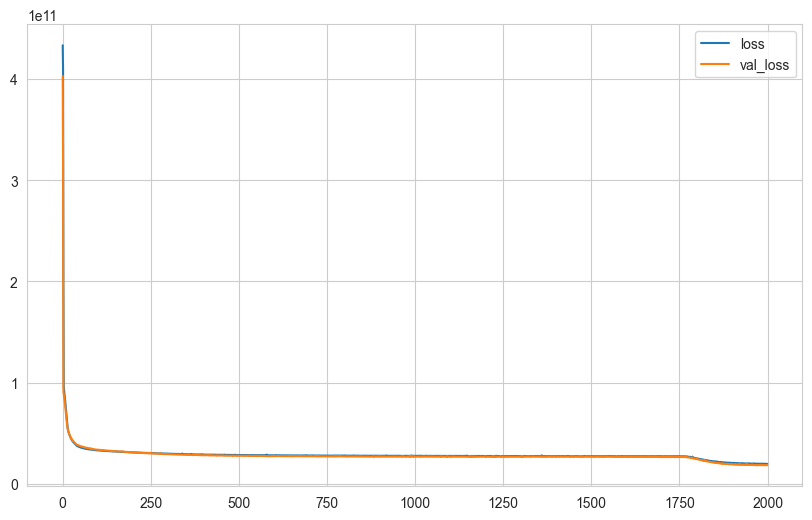

In [316]:
loss_df = pd.DataFrame(model.history.history)
loss_df.plot()

In [317]:
y_pred = model.predict(X_test)

68/68 [==============================] - 0s 614us/step


In [318]:
eval_metric(y_test, y_pred)
# 2000 epoch ile denediğimizde 1750'den sonra local minima'dan çıkma durumu var ancak bu kez de r2 score düştü.
# epoch sayısı yerine diğer parametreler ile oynamak gerekiyor.

r2_score: 0.856097588907565 
mae: 83498.690625 
mse 17329170325.660324 
rmse: 131640.3066148827


### Dropout

The Dropout layer randomly sets input units to 0 with a frequency of `rate`
at each step during training time, which helps prevent overfitting.

Dropout refers to ignoring units (i.e. neurons) during the training phase of certain set of neurons which is chosen at random. By “ignoring”, I mean these units are not considered during a particular forward or backward pass.

For each hidden layer, for each training sample, for each iteration, ignore (zero out) a random fraction, p, of nodes (and corresponding activations).

![dropout.PNG](https://miro.medium.com/max/1400/1*nty4xtm9UBuWLqxHVaamjw.png)
[Source-1](https://medium.com/@amarbudhiraja/https-medium-com-amarbudhiraja-learning-less-to-learn-better-dropout-in-deep-machine-learning-74334da4bfc5)
[Source-2](https://medium.com/unpackai/introduction-of-dropout-and-ensemble-model-in-the-history-of-deep-learning-a4c2a512dcca)

In [ ]:
# Dropout, bir nevi bloke işlemi ya da süzgeçten geçirme işlemi diyebilirz.
# Her batch'den sonra random olarak bazı nöronların çıkışını bloke ederek datanın belli kısımlarını modelden saklamak amaçlanır.
# Model bu durumda, her seferinde yeni bir data'yı görüyormuş gibi hisseder ve datayı ezberlemesi önlenmiş olur.

In [319]:
from tensorflow.keras.layers import Dropout

In [320]:
tf.random.set_seed(seed)

model = Sequential()

model.add(Dense(units = 24, activation = "relu", input_dim = X_train.shape[1]))
model.add(Dropout(0.2))

model.add(Dense(units = 16, activation = "relu"))
model.add(Dropout(0.2))

model.add(Dense(units = 8, activation = "relu"))
model.add(Dropout(0.2))

model.add(Dense(units = 4, activation = "relu"))
model.add(Dropout(0.2))

model.add(Dense(1))

opt = Adam(lr = 0.003)
model.compile(optimizer = opt, loss = "mse")

# Burada her layer'da %20 oranında nöron'u bloke ettik. Her layer'a dropout eklemeye gerek yok.

In [323]:
early_stop = EarlyStopping(monitor = "val_loss", mode = "min", verbose = 1, patience = 100, restore_best_weights = True)

In [324]:
model.fit(x = X_train, y = y_train, validation_split = 0.15, batch_size = 128, epochs = 2000, callbacks = [early_stop])

Epoch 1/2000
130/130 [==============================] - 1s 2ms/step - loss: 432745021440.0000 - val_loss: 400213803008.0000
Epoch 2/2000
130/130 [==============================] - 0s 1ms/step - loss: 381263151104.0000 - val_loss: 242229919744.0000
Epoch 3/2000
130/130 [==============================] - 0s 1ms/step - loss: 179825131520.0000 - val_loss: 95082020864.0000
Epoch 4/2000
130/130 [==============================] - 0s 1ms/step - loss: 147692552192.0000 - val_loss: 91926265856.0000
Epoch 5/2000
130/130 [==============================] - 0s 1ms/step - loss: 145287299072.0000 - val_loss: 88097120256.0000
Epoch 6/2000
130/130 [==============================] - 0s 2ms/step - loss: 138771759104.0000 - val_loss: 82541887488.0000
Epoch 7/2000
130/130 [==============================] - 0s 1ms/step - loss: 133092982784.0000 - val_loss: 81251360768.0000
Epoch 8/2000
130/130 [==============================] - 0s 2ms/step - loss: 132061560832.0000 - val_loss: 75462459392.0000
Epoch 9/2000
1

130/130 [==============================] - 0s 1ms/step - loss: 90791993344.0000 - val_loss: 45063389184.0000
Epoch 68/2000
130/130 [==============================] - 0s 1ms/step - loss: 95985672192.0000 - val_loss: 46006329344.0000
Epoch 69/2000
130/130 [==============================] - 0s 1ms/step - loss: 92053512192.0000 - val_loss: 43015208960.0000
Epoch 70/2000
130/130 [==============================] - 0s 1ms/step - loss: 89999745024.0000 - val_loss: 45169700864.0000
Epoch 71/2000
130/130 [==============================] - 0s 1ms/step - loss: 89086713856.0000 - val_loss: 43837120512.0000
Epoch 72/2000
130/130 [==============================] - 0s 1ms/step - loss: 89864650752.0000 - val_loss: 42741235712.0000
Epoch 73/2000
130/130 [==============================] - 0s 1ms/step - loss: 91413217280.0000 - val_loss: 45330264064.0000
Epoch 74/2000
130/130 [==============================] - 0s 1ms/step - loss: 95764258816.0000 - val_loss: 42829930496.0000
Epoch 75/2000
130/130 [=======

130/130 [==============================] - 0s 2ms/step - loss: 91069947904.0000 - val_loss: 41039466496.0000
Epoch 134/2000
130/130 [==============================] - 0s 1ms/step - loss: 87394516992.0000 - val_loss: 45941215232.0000
Epoch 135/2000
130/130 [==============================] - 0s 1ms/step - loss: 90752557056.0000 - val_loss: 41411117056.0000
Epoch 136/2000
130/130 [==============================] - 0s 1ms/step - loss: 87778156544.0000 - val_loss: 41641500672.0000
Epoch 137/2000
130/130 [==============================] - 0s 1ms/step - loss: 87423754240.0000 - val_loss: 42554716160.0000
Epoch 138/2000
130/130 [==============================] - 0s 2ms/step - loss: 91579727872.0000 - val_loss: 40222068736.0000
Epoch 139/2000
130/130 [==============================] - 0s 2ms/step - loss: 89642729472.0000 - val_loss: 42432765952.0000
Epoch 140/2000
130/130 [==============================] - 0s 2ms/step - loss: 87856758784.0000 - val_loss: 38747029504.0000
Epoch 141/2000
130/130 

130/130 [==============================] - 0s 1ms/step - loss: 87943192576.0000 - val_loss: 37952483328.0000
Epoch 200/2000
130/130 [==============================] - 0s 1ms/step - loss: 87851638784.0000 - val_loss: 36883382272.0000
Epoch 201/2000
130/130 [==============================] - 0s 1ms/step - loss: 89603416064.0000 - val_loss: 38546477056.0000
Epoch 202/2000
130/130 [==============================] - 0s 2ms/step - loss: 84676288512.0000 - val_loss: 38343319552.0000
Epoch 203/2000
130/130 [==============================] - 0s 2ms/step - loss: 88340905984.0000 - val_loss: 39594512384.0000
Epoch 204/2000
130/130 [==============================] - 0s 2ms/step - loss: 87587758080.0000 - val_loss: 40125132800.0000
Epoch 205/2000
130/130 [==============================] - 0s 2ms/step - loss: 87922958336.0000 - val_loss: 40560164864.0000
Epoch 206/2000
130/130 [==============================] - 0s 2ms/step - loss: 85083119616.0000 - val_loss: 38813065216.0000
Epoch 207/2000
130/130 

130/130 [==============================] - 0s 2ms/step - loss: 87585652736.0000 - val_loss: 38995308544.0000
Epoch 266/2000
130/130 [==============================] - 0s 2ms/step - loss: 82241937408.0000 - val_loss: 39231655936.0000
Epoch 267/2000
130/130 [==============================] - 0s 2ms/step - loss: 84658577408.0000 - val_loss: 37678415872.0000
Epoch 268/2000
130/130 [==============================] - 0s 2ms/step - loss: 87595925504.0000 - val_loss: 38867017728.0000
Epoch 269/2000
130/130 [==============================] - 0s 2ms/step - loss: 90368131072.0000 - val_loss: 38409924608.0000
Epoch 270/2000
130/130 [==============================] - 0s 2ms/step - loss: 84651524096.0000 - val_loss: 36509081600.0000
Epoch 271/2000
130/130 [==============================] - 0s 2ms/step - loss: 83932749824.0000 - val_loss: 39050203136.0000
Epoch 272/2000
130/130 [==============================] - 0s 2ms/step - loss: 89471909888.0000 - val_loss: 38415024128.0000
Epoch 273/2000
130/130 

130/130 [==============================] - 0s 1ms/step - loss: 85988982784.0000 - val_loss: 37207613440.0000
Epoch 332/2000
130/130 [==============================] - 0s 2ms/step - loss: 87931281408.0000 - val_loss: 36958040064.0000
Epoch 333/2000
130/130 [==============================] - 0s 2ms/step - loss: 86303424512.0000 - val_loss: 37200896000.0000
Epoch 334/2000
130/130 [==============================] - 0s 1ms/step - loss: 82403442688.0000 - val_loss: 37490577408.0000
Epoch 335/2000
130/130 [==============================] - 0s 1ms/step - loss: 88337727488.0000 - val_loss: 37482889216.0000
Epoch 336/2000
130/130 [==============================] - 0s 1ms/step - loss: 87446552576.0000 - val_loss: 39670325248.0000
Epoch 337/2000
130/130 [==============================] - 0s 2ms/step - loss: 86306914304.0000 - val_loss: 38373584896.0000
Epoch 338/2000
130/130 [==============================] - 0s 2ms/step - loss: 85494611968.0000 - val_loss: 40265302016.0000
Epoch 339/2000
130/130 

130/130 [==============================] - 0s 2ms/step - loss: 84037001216.0000 - val_loss: 37817040896.0000
Epoch 398/2000
130/130 [==============================] - 0s 2ms/step - loss: 84441989120.0000 - val_loss: 39785259008.0000
Epoch 399/2000
130/130 [==============================] - 0s 2ms/step - loss: 90664296448.0000 - val_loss: 37570785280.0000
Epoch 400/2000
130/130 [==============================] - 0s 2ms/step - loss: 82304442368.0000 - val_loss: 39332585472.0000
Epoch 401/2000
130/130 [==============================] - 0s 2ms/step - loss: 87225819136.0000 - val_loss: 39142109184.0000
Epoch 402/2000
130/130 [==============================] - 0s 2ms/step - loss: 85296054272.0000 - val_loss: 37597794304.0000
Epoch 403/2000
130/130 [==============================] - 0s 2ms/step - loss: 84322844672.0000 - val_loss: 37685297152.0000
Epoch 404/2000
130/130 [==============================] - 0s 2ms/step - loss: 87235059712.0000 - val_loss: 38000824320.0000
Epoch 405/2000
130/130 

130/130 [==============================] - 0s 1ms/step - loss: 83910098944.0000 - val_loss: 41858367488.0000
Epoch 464/2000
130/130 [==============================] - 0s 1ms/step - loss: 87334486016.0000 - val_loss: 37168021504.0000
Epoch 465/2000
130/130 [==============================] - 0s 1ms/step - loss: 85938397184.0000 - val_loss: 38592598016.0000
Epoch 466/2000
130/130 [==============================] - 0s 1ms/step - loss: 87905853440.0000 - val_loss: 37848891392.0000
Epoch 467/2000
130/130 [==============================] - 0s 1ms/step - loss: 84280532992.0000 - val_loss: 35241082880.0000
Epoch 468/2000
130/130 [==============================] - 0s 1ms/step - loss: 83901366272.0000 - val_loss: 38382030848.0000
Epoch 469/2000
130/130 [==============================] - 0s 1ms/step - loss: 85515616256.0000 - val_loss: 38231298048.0000
Epoch 470/2000
130/130 [==============================] - 0s 1ms/step - loss: 85903925248.0000 - val_loss: 36041887744.0000
Epoch 471/2000
130/130 

130/130 [==============================] - 0s 1ms/step - loss: 89028780032.0000 - val_loss: 34987446272.0000
Epoch 530/2000
130/130 [==============================] - 0s 1ms/step - loss: 87949221888.0000 - val_loss: 37573267456.0000
Epoch 531/2000
130/130 [==============================] - 0s 1ms/step - loss: 82579529728.0000 - val_loss: 38910029824.0000
Epoch 532/2000
130/130 [==============================] - 0s 1ms/step - loss: 84517986304.0000 - val_loss: 38223343616.0000
Epoch 533/2000
130/130 [==============================] - 0s 1ms/step - loss: 83692945408.0000 - val_loss: 34302142464.0000
Epoch 534/2000
130/130 [==============================] - 0s 1ms/step - loss: 84608811008.0000 - val_loss: 35053174784.0000
Epoch 535/2000
130/130 [==============================] - 0s 1ms/step - loss: 85472092160.0000 - val_loss: 37476552704.0000
Epoch 536/2000
130/130 [==============================] - 0s 1ms/step - loss: 83788775424.0000 - val_loss: 36311707648.0000
Epoch 537/2000
130/130 

130/130 [==============================] - 0s 1ms/step - loss: 85280874496.0000 - val_loss: 35069464576.0000
Epoch 595: early stopping


<AxesSubplot:>

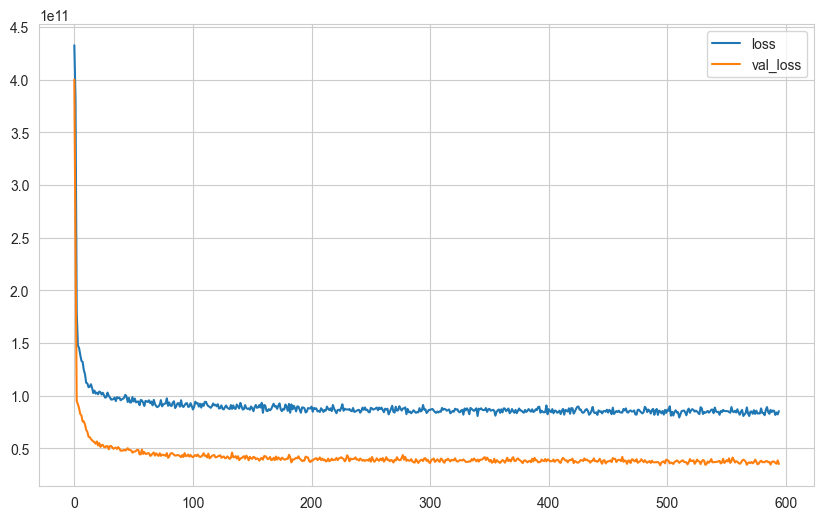

In [325]:
loss_df = pd.DataFrame(model.history.history)
loss_df.plot()

In [326]:
y_pred = model.predict(X_test)

68/68 [==============================] - 0s 667us/step


In [327]:
eval_metric(y_test, y_pred)

# Burada overfitting olmadığı halde dropout kullandığımız için score'larda iyileşme yerin kötüleşme oldu.
# Model güzel güzel öğrenirken nöronlarını biçtik.
# Dropout, bir overfitting durumunda kullanılmalı. Burada eğitim amaçlı denedik.

r2_score: 0.7632389218468805 
mae: 105635.62669994214 
mse 28511496219.246296 
rmse: 168853.47559125425


## Saving Final Model and Scaler

In [328]:
import pickle
pickle.dump(scaler, open("scaler_kc_house", "wb"))

In [329]:
tf.random.set_seed(seed)

model = Sequential()

model.add(Dense(24, activation = 'relu', input_dim = X_train.shape[1]))
model.add(Dense(24, activation = 'relu'))
model.add(Dense(12, activation = 'relu'))
model.add(Dense(6, activation = 'relu'))
model.add(Dense(1))

opt = Adam(lr = 0.003)
model.compile(optimizer = opt, loss = 'mse')

In [330]:
early_stop = EarlyStopping(monitor = "val_loss", mode = "min", verbose = 1, patience = 100, restore_best_weights = True)

In [331]:
model.fit(x = X_train, 
          y = y_train, 
          validation_data = (X_test, y_test), 
          batch_size = 128, 
          epochs = 2000,callbacks = [early_stop])

Epoch 1/2000
152/152 [==============================] - 0s 2ms/step - loss: 427114364928.0000 - val_loss: 396901908480.0000
Epoch 2/2000
152/152 [==============================] - 0s 1ms/step - loss: 278948249600.0000 - val_loss: 85689630720.0000
Epoch 3/2000
152/152 [==============================] - 0s 1ms/step - loss: 94160166912.0000 - val_loss: 78426603520.0000
Epoch 4/2000
152/152 [==============================] - 0s 1ms/step - loss: 89380012032.0000 - val_loss: 74265149440.0000
Epoch 5/2000
152/152 [==============================] - 0s 1ms/step - loss: 84695736320.0000 - val_loss: 70134906880.0000
Epoch 6/2000
152/152 [==============================] - 0s 1ms/step - loss: 79572959232.0000 - val_loss: 65306775552.0000
Epoch 7/2000
152/152 [==============================] - 0s 1ms/step - loss: 73973211136.0000 - val_loss: 60347162624.0000
Epoch 8/2000
152/152 [==============================] - 0s 1ms/step - loss: 67982671872.0000 - val_loss: 55390011392.0000
Epoch 9/2000
152/152 

152/152 [==============================] - 0s 1ms/step - loss: 33057937408.0000 - val_loss: 28772874240.0000
Epoch 68/2000
152/152 [==============================] - 0s 1ms/step - loss: 33019985920.0000 - val_loss: 28701566976.0000
Epoch 69/2000
152/152 [==============================] - 0s 1ms/step - loss: 32977565696.0000 - val_loss: 28900560896.0000
Epoch 70/2000
152/152 [==============================] - 0s 1ms/step - loss: 32948383744.0000 - val_loss: 28557852672.0000
Epoch 71/2000
152/152 [==============================] - 0s 1ms/step - loss: 32943933440.0000 - val_loss: 28450332672.0000
Epoch 72/2000
152/152 [==============================] - 0s 1ms/step - loss: 32813395968.0000 - val_loss: 28390750208.0000
Epoch 73/2000
152/152 [==============================] - 0s 1ms/step - loss: 32814864384.0000 - val_loss: 28372881408.0000
Epoch 74/2000
152/152 [==============================] - 0s 1ms/step - loss: 32812339200.0000 - val_loss: 28392427520.0000
Epoch 75/2000
152/152 [=======

152/152 [==============================] - 0s 1ms/step - loss: 31176067072.0000 - val_loss: 26321113088.0000
Epoch 134/2000
152/152 [==============================] - 0s 1ms/step - loss: 31158560768.0000 - val_loss: 27068047360.0000
Epoch 135/2000
152/152 [==============================] - 0s 1ms/step - loss: 31111448576.0000 - val_loss: 26242359296.0000
Epoch 136/2000
152/152 [==============================] - 0s 1ms/step - loss: 31081158656.0000 - val_loss: 26490781696.0000
Epoch 137/2000
152/152 [==============================] - 0s 1ms/step - loss: 31086323712.0000 - val_loss: 26282807296.0000
Epoch 138/2000
152/152 [==============================] - 0s 1ms/step - loss: 31079141376.0000 - val_loss: 26243194880.0000
Epoch 139/2000
152/152 [==============================] - 0s 1ms/step - loss: 31130951680.0000 - val_loss: 26140839936.0000
Epoch 140/2000
152/152 [==============================] - 0s 1ms/step - loss: 30981322752.0000 - val_loss: 26261870592.0000
Epoch 141/2000
152/152 

152/152 [==============================] - 0s 1ms/step - loss: 29752449024.0000 - val_loss: 24916211712.0000
Epoch 200/2000
152/152 [==============================] - 0s 1ms/step - loss: 29762205696.0000 - val_loss: 24895686656.0000
Epoch 201/2000
152/152 [==============================] - 0s 1ms/step - loss: 29710577664.0000 - val_loss: 25171900416.0000
Epoch 202/2000
152/152 [==============================] - 0s 1ms/step - loss: 29712723968.0000 - val_loss: 24978593792.0000
Epoch 203/2000
152/152 [==============================] - 0s 1ms/step - loss: 29616185344.0000 - val_loss: 24871737344.0000
Epoch 204/2000
152/152 [==============================] - 0s 1ms/step - loss: 29649342464.0000 - val_loss: 25001365504.0000
Epoch 205/2000
152/152 [==============================] - 0s 1ms/step - loss: 29646342144.0000 - val_loss: 25151875072.0000
Epoch 206/2000
152/152 [==============================] - 0s 1ms/step - loss: 29750245376.0000 - val_loss: 25073084416.0000
Epoch 207/2000
152/152 

152/152 [==============================] - 0s 1ms/step - loss: 28642629632.0000 - val_loss: 24022691840.0000
Epoch 266/2000
152/152 [==============================] - 0s 1ms/step - loss: 28651677696.0000 - val_loss: 24315025408.0000
Epoch 267/2000
152/152 [==============================] - 0s 1ms/step - loss: 28616572928.0000 - val_loss: 23956369408.0000
Epoch 268/2000
152/152 [==============================] - 0s 1ms/step - loss: 28587565056.0000 - val_loss: 24136751104.0000
Epoch 269/2000
152/152 [==============================] - 0s 1ms/step - loss: 28636882944.0000 - val_loss: 24344889344.0000
Epoch 270/2000
152/152 [==============================] - 0s 1ms/step - loss: 28604368896.0000 - val_loss: 24432695296.0000
Epoch 271/2000
152/152 [==============================] - 0s 1ms/step - loss: 28727072768.0000 - val_loss: 24015820800.0000
Epoch 272/2000
152/152 [==============================] - 0s 2ms/step - loss: 28524775424.0000 - val_loss: 24252596224.0000
Epoch 273/2000
152/152 

152/152 [==============================] - 0s 1ms/step - loss: 28034859008.0000 - val_loss: 23633698816.0000
Epoch 332/2000
152/152 [==============================] - 0s 1ms/step - loss: 27984506880.0000 - val_loss: 23631437824.0000
Epoch 333/2000
152/152 [==============================] - 0s 1ms/step - loss: 28019732480.0000 - val_loss: 23645177856.0000
Epoch 334/2000
152/152 [==============================] - 0s 1ms/step - loss: 27991429120.0000 - val_loss: 23610540032.0000
Epoch 335/2000
152/152 [==============================] - 0s 1ms/step - loss: 28018866176.0000 - val_loss: 23600570368.0000
Epoch 336/2000
152/152 [==============================] - 0s 1ms/step - loss: 27974344704.0000 - val_loss: 23585945600.0000
Epoch 337/2000
152/152 [==============================] - 0s 1ms/step - loss: 27944962048.0000 - val_loss: 23622092800.0000
Epoch 338/2000
152/152 [==============================] - 0s 1ms/step - loss: 27950315520.0000 - val_loss: 23665790976.0000
Epoch 339/2000
152/152 

152/152 [==============================] - 0s 1ms/step - loss: 27632842752.0000 - val_loss: 23363532800.0000
Epoch 398/2000
152/152 [==============================] - 0s 1ms/step - loss: 27629105152.0000 - val_loss: 23311661056.0000
Epoch 399/2000
152/152 [==============================] - 0s 1ms/step - loss: 27641886720.0000 - val_loss: 23670450176.0000
Epoch 400/2000
152/152 [==============================] - 0s 1ms/step - loss: 27613214720.0000 - val_loss: 23361239040.0000
Epoch 401/2000
152/152 [==============================] - 0s 1ms/step - loss: 27585196032.0000 - val_loss: 23351445504.0000
Epoch 402/2000
152/152 [==============================] - 0s 1ms/step - loss: 27597803520.0000 - val_loss: 23459598336.0000
Epoch 403/2000
152/152 [==============================] - 0s 1ms/step - loss: 27712862208.0000 - val_loss: 23357112320.0000
Epoch 404/2000
152/152 [==============================] - 0s 1ms/step - loss: 27769968640.0000 - val_loss: 23483043840.0000
Epoch 405/2000
152/152 

152/152 [==============================] - 0s 1ms/step - loss: 27344885760.0000 - val_loss: 23127683072.0000
Epoch 464/2000
152/152 [==============================] - 0s 1ms/step - loss: 27426877440.0000 - val_loss: 23146754048.0000
Epoch 465/2000
152/152 [==============================] - 0s 1ms/step - loss: 27362482176.0000 - val_loss: 23452610560.0000
Epoch 466/2000
152/152 [==============================] - 0s 1ms/step - loss: 27426631680.0000 - val_loss: 23272835072.0000
Epoch 467/2000
152/152 [==============================] - 0s 1ms/step - loss: 27394752512.0000 - val_loss: 23115102208.0000
Epoch 468/2000
152/152 [==============================] - 0s 1ms/step - loss: 27448543232.0000 - val_loss: 23162515456.0000
Epoch 469/2000
152/152 [==============================] - 0s 1ms/step - loss: 27292676096.0000 - val_loss: 23437991936.0000
Epoch 470/2000
152/152 [==============================] - 0s 1ms/step - loss: 27385337856.0000 - val_loss: 23359051776.0000
Epoch 471/2000
152/152 

152/152 [==============================] - 0s 1ms/step - loss: 27194587136.0000 - val_loss: 23041757184.0000
Epoch 530/2000
152/152 [==============================] - 0s 1ms/step - loss: 27209148416.0000 - val_loss: 23017857024.0000
Epoch 531/2000
152/152 [==============================] - 0s 1ms/step - loss: 27193122816.0000 - val_loss: 23235479552.0000
Epoch 532/2000
152/152 [==============================] - 0s 1ms/step - loss: 27168444416.0000 - val_loss: 23032119296.0000
Epoch 533/2000
152/152 [==============================] - 0s 1ms/step - loss: 27151566848.0000 - val_loss: 23121936384.0000
Epoch 534/2000
152/152 [==============================] - 0s 1ms/step - loss: 27181625344.0000 - val_loss: 23054981120.0000
Epoch 535/2000
152/152 [==============================] - 0s 1ms/step - loss: 27158665216.0000 - val_loss: 23088242688.0000
Epoch 536/2000
152/152 [==============================] - 0s 1ms/step - loss: 27192797184.0000 - val_loss: 23034894336.0000
Epoch 537/2000
152/152 

152/152 [==============================] - 0s 1ms/step - loss: 27019462656.0000 - val_loss: 23423680512.0000
Epoch 596/2000
152/152 [==============================] - 0s 1ms/step - loss: 27136645120.0000 - val_loss: 23170756608.0000
Epoch 597/2000
152/152 [==============================] - 0s 1ms/step - loss: 27097704448.0000 - val_loss: 23135727616.0000
Epoch 598/2000
152/152 [==============================] - 0s 2ms/step - loss: 27085840384.0000 - val_loss: 23135686656.0000
Epoch 599/2000
152/152 [==============================] - 0s 1ms/step - loss: 27091533824.0000 - val_loss: 23219494912.0000
Epoch 600/2000
152/152 [==============================] - 0s 1ms/step - loss: 27037986816.0000 - val_loss: 23375958016.0000
Epoch 601/2000
152/152 [==============================] - 0s 1ms/step - loss: 27117000704.0000 - val_loss: 23489019904.0000
Epoch 602/2000
152/152 [==============================] - 0s 1ms/step - loss: 27033841664.0000 - val_loss: 23143821312.0000
Epoch 603/2000
152/152 

<AxesSubplot:>

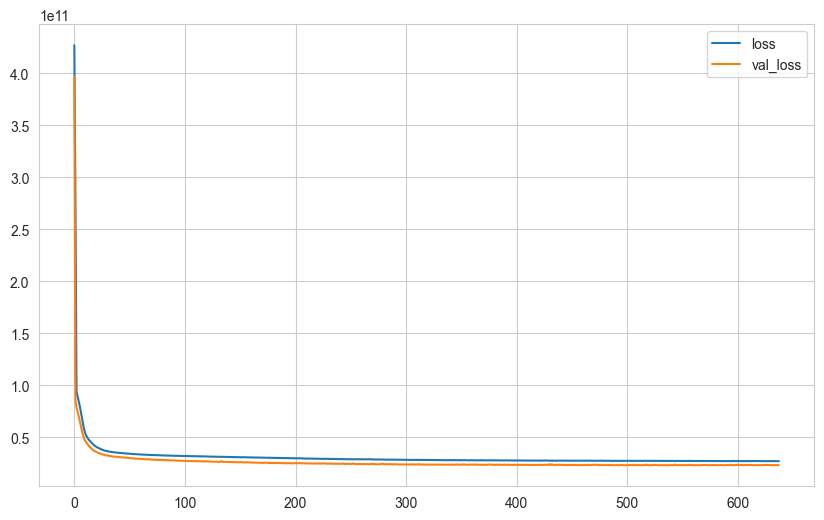

In [332]:
loss_df = pd.DataFrame(model.history.history)
loss_df.plot()

In [333]:
y_pred = model.predict(X_test)

68/68 [==============================] - 0s 732us/step


In [334]:
eval_metric(y_test, y_pred)
# burada herşeyi aynı yapmamıza rağmen düşük bir score geldi. Bu yüzden iyi score alınan yerde modeli save etmek gerekir.!!!

r2_score: 0.8088727711616536 
mae: 98124.61952039931 
mse 23016127924.942616 
rmse: 151710.67175694206


In [335]:
model.save('model_kc_house.h5')

## Loading Model and Scaler

In [336]:
from tensorflow.keras.models import load_model

In [337]:
model_kc_house = load_model("model_kc_house.h5")
scaler_kc_house = pickle.load(open("scaler_kc_house", "rb"))

## Prediction

In [339]:
single_house = df.drop('price', axis = 1).iloc[0:1, :]
single_house

,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,lat,long,sqft_living15,sqft_lot15,built|renovated
0,3,1.000,1180,5650,1.000,0,0,3,7,1180,0,47.511,-122.257,1340,5650,1955.000


In [340]:
single_house = scaler_kc_house.transform(single_house)
single_house

array([[0.22222222, 0.06666667, 0.06079027, 0.00310751, 0.        ,
        0.        , 0.        , 0.5       , 0.4       , 0.08859358,
        0.        , 0.57149751, 0.21760797, 0.16193426, 0.00573322,
        0.47826087]])

In [341]:
model_kc_house.predict(single_house)

1/1 [==============================] - 0s 42ms/step


array([[284235.56]], dtype=float32)

In [342]:
df.iloc[0][0]

221900.0

## Comparison with ML

### Linear Regression

In [343]:
from sklearn.linear_model import LinearRegression

In [344]:
linear_model = LinearRegression()
linear_model.fit(X_train, y_train)
y_pred = linear_model.predict(X_test)

In [345]:
eval_metric(y_test, y_pred)

r2_score: 0.6877930531366372 
mae: 128285.21936188269 
mse 37596919453.79795 
rmse: 193899.25078194076


### Random Forest

In [346]:
from sklearn.ensemble import RandomForestRegressor

In [347]:
rf_model = RandomForestRegressor(random_state = seed)
rf_model.fit(X_train, y_train)
y_pred = rf_model.predict(X_test)

In [348]:
eval_metric(y_test, y_pred)

r2_score: 0.8801000088847334 
mae: 66157.84700705468 
mse 14438725190.969683 
rmse: 120161.24662706227


In [349]:
# Burada kıyaslamalara bakınca "Random Forest" ın random değerlerle bile daha iyi sonuç aldığını gördük.
# Ancak çok büyük datalarda Random Forest iyi score vermez bunun yerine ANN kullanılmalı.

___

<p style="text-align: center;"><img src="https://docs.google.com/uc?id=1lY0Uj5R04yMY3-ZppPWxqCr5pvBLYPnV" class="img-fluid" alt="CLRSWY"></p>

___